# 4B — BRUM-aligned leave-one-out (LOO) 3DGS training 

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Configuration

In [ ]:
from pathlib import Path
import os, sys, json, shutil, subprocess, textwrap, math, glob, random
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

DRIVE_ROOT = Path('/content/drive/MyDrive')
PROJECT_ROOT = DRIVE_ROOT / 'ResearchProject'

CAR_ID_INPUT = '26004751'
CAR_ID = CAR_ID_INPUT if str(CAR_ID_INPUT).startswith('car_') else f'car_{CAR_ID_INPUT}'


DUST3R_OUTPUT_ROOT = PROJECT_ROOT / 'dust3r_outputs_batch_strict_singlecar_method_v1'
CAR_DIR = DUST3R_OUTPUT_ROOT / CAR_ID
BRUM_PKG = CAR_DIR / 'brum_ready_scene.pt'

NOVEL_ROOT = CAR_DIR / 'novel_views_brum_strict_v7_slerp_depth'
NOVEL_META = NOVEL_ROOT / 'novel_views_manifest.json'
NOVEL_BRUM_META = NOVEL_ROOT / 'novel_views_brum_manifest.json'
NOVEL_OBJECT_META = NOVEL_ROOT / 'novel_views_object_manifest.json'
NOVEL_CSV = NOVEL_ROOT / 'novel_view_summary.csv'
NOVEL_CONFIG = NOVEL_ROOT / 'augmentation_config_brum_strict_v7_slerp_depth.json'

GS_REPO = PROJECT_ROOT / 'gaussian-splatting'
GS_BRUM_ROOT = PROJECT_ROOT / 'gs_outputs_brum_strict_v7_slerp_depth'
SCENE_ROOT = GS_BRUM_ROOT / CAR_ID / 'scene_graphdeco_brum_strict_v7_slerp_depth'
SCRIPT_DIR = GS_BRUM_ROOT / 'scripts'
SCRIPT_DIR.mkdir(parents=True, exist_ok=True)
TRAIN_SCRIPT = SCRIPT_DIR / 'train_brum_strict_v8.py'

MODEL_ROOT = GS_BRUM_ROOT / CAR_ID / 'model_brum_strict_v8_LOO_CV_ALLDATA_METHODS'
EVAL_ROOT = GS_BRUM_ROOT / CAR_ID / 'eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS'
DIAG_ROOT = EVAL_ROOT / 'diagnostics'
DIAG_ROOT.mkdir(parents=True, exist_ok=True)
ITERATIONS = 5000
SH_DEGREE = 3
MAX_INIT_POINTS = 250000


BRUM_LAMBDA_GEN = 1.0
BRUM_GEN_EVERY = 1
USE_GENERATED_WEIGHT = True

USE_REAL_MASKED_LOSS = False

WHITE_BACKGROUND = False
RANDOM_BACKGROUND = False

OVERWRITE_SCENE = True
OVERWRITE_MODEL = True

MAX_GENERATED_H = 0.08
MIN_TRAIN_MASK_PIXELS = 500

BRUM_W, BRUM_H = 512, 256
BRUM_K = np.array([[512., 0., 256.],
                   [0., 512., 128.],
                   [0.,   0.,   1.]], dtype=np.float64)

EXPECTED_AUG_SCHEMA = 'BRUM_STRICT_AUGMENTATION_V7_SLERP_DEPTH'
EXPECTED_POSE_INTERPOLATION = 'translation_linear_rotation_slerp'
EXPECTED_RENDERING_MODE = 'depth_aware_zbuffer_splatting'

STALE_TOKENS_FORBIDDEN_IN_OUTPUTS = [
    'novel_views_brum_strict_v6',
    'gs_outputs_brum_strict_v6',
    'paper_equivalent',
    'real_unmasked',
    'SMOKE'
]

print('CAR_ID           :', CAR_ID)
print('BRUM_PKG         :', BRUM_PKG, BRUM_PKG.exists())
print('NOVEL_META       :', NOVEL_META, NOVEL_META.exists())
print('NOVEL_CONFIG     :', NOVEL_CONFIG, NOVEL_CONFIG.exists())
print('GS_REPO          :', GS_REPO, GS_REPO.exists())
print('SCENE_ROOT       :', SCENE_ROOT)
print('MODEL_ROOT       :', MODEL_ROOT)
print('EVAL_ROOT        :', EVAL_ROOT)
print('ITERATIONS       :', ITERATIONS)
print('Generated loss   : masked weighted L1 only; no generated SSIM/DSSIM')

def assert_strict_4b_paths():
    expected_root = 'dust3r_outputs_batch_strict_singlecar_method_v1'
    expected_aug = 'novel_views_brum_strict_v7_slerp_depth'
    for p in [DUST3R_OUTPUT_ROOT, CAR_DIR, BRUM_PKG, NOVEL_ROOT, NOVEL_META]:
        ps = str(p)
        assert expected_root in ps, f'Wrong 2B root: {ps}'
    assert expected_aug in str(NOVEL_ROOT), f'Wrong 3A root: {NOVEL_ROOT}'
    for p in [GS_BRUM_ROOT, SCENE_ROOT, MODEL_ROOT, EVAL_ROOT, TRAIN_SCRIPT]:
        ps = str(p)
        for bad in STALE_TOKENS_FORBIDDEN_IN_OUTPUTS:
            assert bad not in ps, f'Stale token {bad} in output path: {ps}'
    assert BRUM_PKG.exists(), f'Missing 2B package: {BRUM_PKG}'
    assert NOVEL_META.exists(), f'Missing 3A v7 manifest: {NOVEL_META}'
    assert GS_REPO.exists(), f'Missing gaussian-splatting repo: {GS_REPO}'
    print('✅ strict 4B paths pass: 2B strict package + 3A v7 SLERP/depth outputs')

assert_strict_4b_paths()


CAR_ID           : car_26004751
BRUM_PKG         : /content/drive/MyDrive/ResearchProject/dust3r_outputs_batch_strict_singlecar_method_v1/car_26004751/brum_ready_scene.pt True
NOVEL_META       : /content/drive/MyDrive/ResearchProject/dust3r_outputs_batch_strict_singlecar_method_v1/car_26004751/novel_views_brum_strict_v7_slerp_depth/novel_views_manifest.json True
NOVEL_CONFIG     : /content/drive/MyDrive/ResearchProject/dust3r_outputs_batch_strict_singlecar_method_v1/car_26004751/novel_views_brum_strict_v7_slerp_depth/augmentation_config_brum_strict_v7_slerp_depth.json True
GS_REPO          : /content/drive/MyDrive/ResearchProject/gaussian-splatting True
SCENE_ROOT       : /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth
MODEL_ROOT       : /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v8_LOO_CV_ALLDATA_METHODS
EVAL_ROOT        : /content/drive

## 2. Install/check GraphDECO dependencies

In [3]:

!pip install -q plyfile tqdm opencv-python imageio imageio-ffmpeg scikit-image lpips ninja

import os, sys, subprocess, shutil
from pathlib import Path
import torch

torch_lib = Path(torch.__file__).parent / 'lib'
cuda_lib = Path('/usr/local/cuda/lib64')
os.environ['LD_LIBRARY_PATH'] = f'{torch_lib}:{cuda_lib}:' + os.environ.get('LD_LIBRARY_PATH','')
os.environ['LIBRARY_PATH'] = f'{torch_lib}:{cuda_lib}:' + os.environ.get('LIBRARY_PATH','')
os.environ['TORCH_CUDA_ARCH_LIST'] = '7.5;8.0;8.6;8.9;9.0'

if str(GS_REPO) not in sys.path:
    sys.path.insert(0, str(GS_REPO))
os.environ['PYTHONPATH'] = str(GS_REPO) + ':' + os.environ.get('PYTHONPATH','')

print('Torch:', torch.__version__)
print('CUDA available:', torch.cuda.is_available())
print('Torch lib:', torch_lib)


LOCAL_GS_REPO = Path('/content/gaussian-splatting_local')
if not LOCAL_GS_REPO.exists():
    shutil.copytree(GS_REPO, LOCAL_GS_REPO, ignore=shutil.ignore_patterns('output', '*.ply', '__pycache__'))
print('LOCAL_GS_REPO:', LOCAL_GS_REPO)

def install_cuda_submodule(module_name, subdir, import_test):
    try:
        exec(import_test, globals(), globals())
        print(f'✅ {module_name} already importable')
        return
    except Exception as e:
        print(f'Installing {module_name}; previous import failed with: {repr(e)}')
    path = LOCAL_GS_REPO / 'submodules' / subdir
    assert path.exists(), f'Missing submodule: {path}. Run git submodule update --init --recursive in {GS_REPO}'
    cmd = [sys.executable, '-m', 'pip', 'install', str(path), '--no-build-isolation', '--verbose']
    print(' '.join(map(str, cmd)))
    r = subprocess.run(cmd, cwd=str(path), text=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT)
    print(r.stdout)
    if r.returncode != 0:
        raise RuntimeError(f'{module_name} install failed with code {r.returncode}')
    exec(import_test, globals(), globals())
    print(f'✅ {module_name} OK')

install_cuda_submodule('simple_knn', 'simple-knn', 'from simple_knn._C import distCUDA2')
install_cuda_submodule('diff_gaussian_rasterization', 'diff-gaussian-rasterization', 'from diff_gaussian_rasterization import GaussianRasterizationSettings, GaussianRasterizer')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 22.3 MB/s eta 0:00:00
Torch: 2.10.0+cu128
CUDA available: True
Torch lib: /usr/local/lib/python3.12/dist-packages/torch/lib
LOCAL_GS_REPO: /content/gaussian-splatting_local
Installing simple_knn; previous import failed with: ModuleNotFoundError("No module named 'simple_knn'")
/usr/bin/python3 -m pip install /content/gaussian-splatting_local/submodules/simple-knn --no-build-isolation --verbose
Using pip 24.1.2 from /usr/local/lib/python3.12/dist-packages/pip (python 3.12)
Processing /content/gaussian-splatting_local/submodules/simple-knn
  Preparing metadata (setup.py): started
  Running command python setup.py egg_info
  running egg_info
  creating /tmp/pip-pip-egg-info-5wby18h5/simple_knn.egg-info
  writing /tmp/pip-pip-egg-info-5wby18h5/simple_knn.egg-info/PKG-INFO
  wri

## 3. Build GraphDECO scene: real images segmentation-filtered full canvas, generated masks kept for augmented loss

In [4]:
import torch

def to_numpy(x, dtype=np.float64):
    if torch.is_tensor(x):
        x = x.detach().cpu().numpy()
    return np.asarray(x, dtype=dtype)

def qvec_from_rotmat(R):
    R = np.asarray(R, dtype=np.float64)
    Kq = np.array([
        [R[0,0]-R[1,1]-R[2,2], 0, 0, 0],
        [R[1,0]+R[0,1], R[1,1]-R[0,0]-R[2,2], 0, 0],
        [R[2,0]+R[0,2], R[2,1]+R[1,2], R[2,2]-R[0,0], 0],
        [R[2,1]-R[1,2], R[0,2]-R[2,0], R[1,0]-R[0,1], R[0,0]+R[1,1]+R[2,2]],
    ], dtype=np.float64) / 3.0
    eigvals, eigvecs = np.linalg.eigh(Kq)
    q = eigvecs[[3,0,1,2], np.argmax(eigvals)]
    if q[0] < 0:
        q *= -1
    return q

def ensure_uint8_rgb(arr):
    arr = np.asarray(arr)
    if arr.ndim == 2:
        arr = np.repeat(arr[..., None], 3, axis=-1)
    if arr.shape[-1] == 4:
        arr = arr[..., :3]
    if arr.dtype != np.uint8:
        arr = ((arr * 255) if np.nanmax(arr) <= 1.0 else arr).clip(0, 255).astype(np.uint8)
    return arr

def ensure_mask_u8(mask, size_hw=None):
    m = np.asarray(mask)
    if m.ndim == 3:
        m = m[..., 0]
    m = (m > 0).astype(np.uint8) * 255
    im = Image.fromarray(m)
    if size_hw is not None:
        H, W = size_hw
        if im.size != (W, H):
            im = im.resize((W, H), Image.NEAREST)
    return np.asarray(im)

def generated_mask_stats(mask_path, weight_path=None):
    """
    BRUM generated masks are valid-loss masks, NOT object-only masks.
    White/large masks are allowed.
    """
    m_img = Image.open(mask_path).convert("L")
    m = np.asarray(m_img, dtype=np.float32) / 255.0
    valid = m > 0.5
    valid_frac = float(valid.mean())

    stats = {
        "valid_frac": valid_frac,
        "weight_mean_valid": None,
        "weight_min": None,
        "weight_max": None,
    }

    if weight_path and Path(weight_path).exists():
        w_img = Image.open(weight_path).convert("L")
        if w_img.size != m_img.size:
            w_img = w_img.resize(m_img.size, Image.BILINEAR)
        w = np.asarray(w_img, dtype=np.float32) / 255.0

        stats["weight_min"] = float(w.min())
        stats["weight_max"] = float(w.max())
        stats["weight_mean_valid"] = float(w[valid].mean()) if valid.any() else 0.0

    return stats

def load_generated_records():
    src = NOVEL_BRUM_META if NOVEL_BRUM_META.exists() else (
        NOVEL_OBJECT_META if NOVEL_OBJECT_META.exists() else NOVEL_META
    )
    assert src.exists(), f"Missing generated manifest: {src}"

    records = json.loads(src.read_text())
    clean = []

    for r in records:
        rr = dict(r)

        # BRUM uncertainty / view-quality filter.
        if float(rr.get("h", 999.0)) > MAX_GENERATED_H:
            continue

        # IMPORTANT:
        # train_mask_path is BRUM valid-supervision / XNOR mask.
        train_mask_path = (
            rr.get("train_mask_path")
            or rr.get("xnor_mask_path")
            or rr.get("and_mask_path")
            or rr.get("source_mask_path")
        )
        if not train_mask_path or not Path(train_mask_path).exists():
            continue

        train_weight_path = rr.get("train_weight_path") or rr.get("weight_path")
        if train_weight_path is not None and not Path(train_weight_path).exists():
            train_weight_path = None

        nmask = int(rr.get("n_mask_pixels_train", rr.get("n_mask_pixels_and_support", 0)))
        if nmask < MIN_TRAIN_MASK_PIXELS:
            continue

        stats = generated_mask_stats(train_mask_path, train_weight_path)

        # Only reject truly empty valid-supervision masks.
        # Large valid_frac like 0.95-0.99 is okay for BRUM.
        if stats["valid_frac"] <= 0.001:
            continue

        rr["train_mask_path"] = str(train_mask_path)
        rr["train_weight_path"] = str(train_weight_path) if train_weight_path else None
        rr["train_mask_mode"] = rr.get("train_mask_mode", "brum_valid_loss_mask")

        rr["brum_valid_frac"] = stats["valid_frac"]
        rr["brum_weight_mean_valid"] = stats["weight_mean_valid"]
        rr["brum_weight_min"] = stats["weight_min"]
        rr["brum_weight_max"] = stats["weight_max"]

        clean.append(rr)

    print("Generated records before filtering:", len(records))
    print("Generated records kept for BRUM training:", len(clean))

    if len(clean) == 0:
        raise RuntimeError(
            "No generated BRUM records kept. Check manifest paths, MAX_GENERATED_H, and MIN_TRAIN_MASK_PIXELS."
        )

    vals = np.array([r["brum_valid_frac"] for r in clean], dtype=np.float32)
    print("BRUM valid-mask frac min/med/max:", vals.min(), np.median(vals), vals.max())

    wvals = [
        r["brum_weight_mean_valid"]
        for r in clean
        if r["brum_weight_mean_valid"] is not None
    ]
    if len(wvals):
        wvals = np.array(wvals, dtype=np.float32)
        print("BRUM weight mean(valid) min/med/max:", wvals.min(), np.median(wvals), wvals.max())
        if float(wvals.max()) == 0.0:
            print("WARNING: generated weight maps are all zero. Train with USE_GENERATED_WEIGHT=False.")
    else:
        print("No generated weight paths found. Train with USE_GENERATED_WEIGHT=False or mask-only generated loss.")

    return clean, src


assert BRUM_PKG.exists(), f"Missing {BRUM_PKG}. Run 2B strict first."
pkg = torch.load(BRUM_PKG, map_location="cpu", weights_only=False)

required_pkg = [
    "views", "image_paths", "images", "masks", "K_list", "P_list",
    "image_sizes_wh", "global_xyz_multiview", "confs",
    "brum_canvas_wh", "brum_real_confidence_gamma", "shared_K"
]
missing = [k for k in required_pkg if k not in pkg]
if missing:
    raise KeyError(f"{BRUM_PKG} missing required keys: {missing}")

views = list(pkg["views"])
image_paths = [Path(p) for p in pkg["image_paths"]]
K_list = [to_numpy(k, np.float64) for k in pkg["K_list"]]
P_list = [to_numpy(p, np.float64) for p in pkg["P_list"]]
image_sizes_wh = [tuple(map(int, wh)) for wh in pkg["image_sizes_wh"]]
real_masks = [to_numpy(m, np.float32) for m in pkg["masks"]]
images_pkg = [ensure_uint8_rgb(x) for x in pkg["images"]]

EXPECTED_VIEWS = [
    'front', 'front_left', 'side_left', 'rear_left',
    'rear', 'rear_right', 'side_right', 'front_right'
]
assert views == EXPECTED_VIEWS, f"View order mismatch: {views}"
assert len(views) == 8
assert list(map(int, pkg["brum_canvas_wh"])) == [512, 256], pkg["brum_canvas_wh"]
assert float(pkg["brum_real_confidence_gamma"]) == 1.5
assert np.allclose(np.asarray(pkg["shared_K"], dtype=np.float64), BRUM_K, atol=1e-6)

for i, (K, wh, img, m) in enumerate(zip(K_list, image_sizes_wh, images_pkg, real_masks)):
    assert wh == (BRUM_W, BRUM_H), f"{views[i]} image_sizes_wh={wh}"
    assert img.shape[:2] == (BRUM_H, BRUM_W), f"{views[i]} image shape={img.shape}"
    assert m.shape[:2] == (BRUM_H, BRUM_W), f"{views[i]} mask shape={m.shape}"
    assert np.allclose(K, BRUM_K, atol=1e-6), f"{views[i]} K mismatch: {K}"

print("✅ 2B strict BRUM package strict checks pass")
print("BRUM package background_supervision:", pkg.get("background_supervision", "unknown"))

# Check 3A v7 SLERP/depth-aware augmentation package.
novel_records_all = json.loads(NOVEL_META.read_text())
assert len(novel_records_all) > 0, f"Empty generated manifest: {NOVEL_META}"
assert all(str(r.get("schema_version", "")).startswith("BRUM_STRICT_AUGMENTATION_V7_SLERP_DEPTH") for r in novel_records_all), "Generated records are not 3A v7 SLERP/depth-aware schema"
for r in novel_records_all:
    assert float(r["h"]) <= MAX_GENERATED_H + 1e-9
    assert r.get("generated_loss_policy_for_4B") == "masked_weighted_L1_only_no_generated_SSIM"
    assert np.allclose(np.asarray(r["K"], dtype=np.float64), BRUM_K, atol=1e-6)
    for k in ["image_path", "train_mask_path", "train_weight_path", "P_w2c", "T_c2w"]:
        assert k in r, f"generated record missing {k}"
    # v7-specific outputs from SLERP + depth-aware z-buffer augmentation.
    assert r.get("pose_interpolation") == EXPECTED_POSE_INTERPOLATION, r.get("pose_interpolation")
    assert r.get("rendering_mode") == EXPECTED_RENDERING_MODE, r.get("rendering_mode")
    for k in ["source_depth_path", "full_depth_path", "source_depth_vis_path", "full_depth_vis_path"]:
        assert k in r, f"v7 generated record missing {k}"
        assert Path(r[k]).exists(), r[k]
    assert Path(r["image_path"]).exists(), r["image_path"]
    assert Path(r["train_mask_path"]).exists(), r["train_mask_path"]
    assert Path(r["train_weight_path"]).exists(), r["train_weight_path"]

print("✅ 3A v7 SLERP/depth-aware generated manifest strict checks pass:", len(novel_records_all), "records")

if OVERWRITE_SCENE and SCENE_ROOT.exists():
    shutil.rmtree(SCENE_ROOT)

images_dir = SCENE_ROOT / "images"
real_mask_dir = SCENE_ROOT / "real_object_masks"
diagnostic_mask_dir = SCENE_ROOT / "real_object_masks_for_diagnostics_only"
sparse_dir = SCENE_ROOT / "sparse" / "0"

for d in [images_dir, real_mask_dir, diagnostic_mask_dir, sparse_dir]:
    d.mkdir(parents=True, exist_ok=True)

# Write real images as full-canvas segmentation-filtered images.
# This preserves camera canvas while removing background supervision.
real_image_names = []
real_mask_manifest = {}
for i, p in enumerate(image_paths):
    safe_view = str(views[i]).replace("/", "_")
    name = f"real_{i:02d}_{safe_view}.png"
    dst = images_dir / name
    mask_dst = real_mask_dir / name
    diagnostic_dst = diagnostic_mask_dir / name

    if p.exists():
        img = Image.open(p).convert("RGB")
        arr = np.asarray(img, dtype=np.uint8)
    else:
        arr = images_pkg[i]

    assert arr.shape[:2] == (BRUM_H, BRUM_W), f"{name}: wrong image shape {arr.shape}"

    m = ensure_mask_u8(real_masks[i], (BRUM_H, BRUM_W)) > 0
    assert m.shape == (BRUM_H, BRUM_W)
    assert m.mean() > 0.01, f"{name}: empty real mask"
    Image.fromarray((m.astype(np.uint8) * 255), mode="L").save(mask_dst)
    Image.fromarray((m.astype(np.uint8) * 255), mode="L").save(diagnostic_dst)

    # Black outside foreground because WHITE_BACKGROUND=False.
    arr_masked = np.where(m[..., None], arr, 0).astype(np.uint8)
    Image.fromarray(arr_masked, mode="RGB").save(dst)

    real_image_names.append(name)
    real_mask_manifest[name] = str(mask_dst)
    real_mask_manifest[Path(name).stem] = str(mask_dst)

(SCENE_ROOT / "real_mask_manifest.json").write_text(json.dumps(real_mask_manifest, indent=2))

# cameras.txt
cam_lines = [
    "# Camera list",
    "# CAMERA_ID, MODEL, WIDTH, HEIGHT, PARAMS[]",
    f"# Number of cameras: {len(real_image_names)}",
]
for i, (K, (W, H)) in enumerate(zip(K_list, image_sizes_wh), start=1):
    fx, fy, cx, cy = K[0, 0], K[1, 1], K[0, 2], K[1, 2]
    assert (W, H) == (BRUM_W, BRUM_H)
    cam_lines.append(f"{i} PINHOLE {W} {H} {fx:.12f} {fy:.12f} {cx:.12f} {cy:.12f}")
(sparse_dir / "cameras.txt").write_text("\n".join(cam_lines) + "\n")

# images.txt
img_lines = [
    "# Image list",
    "# IMAGE_ID, QW, QX, QY, QZ, TX, TY, TZ, CAMERA_ID, NAME",
    f"# Number of images: {len(real_image_names)}",
]
for i, (P, name) in enumerate(zip(P_list, real_image_names), start=1):
    q = qvec_from_rotmat(P[:3, :3])
    t = P[:3, 3]
    img_lines.append(
        f"{i} "
        f"{q[0]:.12f} {q[1]:.12f} {q[2]:.12f} {q[3]:.12f} "
        f"{t[0]:.12f} {t[1]:.12f} {t[2]:.12f} "
        f"{i} {name}"
    )
    img_lines.append("")
(sparse_dir / "images.txt").write_text("\n".join(img_lines) + "\n")

# Initial point cloud from DUSt3R global alignment.
xyz = to_numpy(pkg["global_xyz_multiview"], np.float64)
xyz = xyz[np.isfinite(xyz).all(axis=1)]
assert len(xyz) > 0

if len(xyz) > MAX_INIT_POINTS:
    rng = np.random.default_rng(0)
    xyz = xyz[rng.choice(len(xyz), MAX_INIT_POINTS, replace=False)]

print("Initial xyz points used:", len(xyz))
print("xyz min:", xyz.min(axis=0))
print("xyz max:", xyz.max(axis=0))
print("xyz range:", xyz.max(axis=0) - xyz.min(axis=0))

colors = np.full((len(xyz), 3), 180, dtype=np.uint8)
pt_lines = [
    "# 3D point list",
    "# POINT3D_ID, X, Y, Z, R, G, B, ERROR, TRACK[]",
    f"# Number of points: {len(xyz)}",
]
for j, (x, c) in enumerate(zip(xyz, colors), start=1):
    pt_lines.append(
        f"{j} {x[0]:.12f} {x[1]:.12f} {x[2]:.12f} "
        f"{int(c[0])} {int(c[1])} {int(c[2])} 1.0"
    )
(sparse_dir / "points3D.txt").write_text("\n".join(pt_lines) + "\n")

# Copy strict generated manifest into the scene in legacy-compatible names.
clean, manifest_source = load_generated_records()
for r in clean:
    assert Path(r["image_path"]).exists()
    assert Path(r["train_mask_path"]).exists()
    assert r["train_weight_path"] is None or Path(r["train_weight_path"]).exists()
    assert r.get("generated_loss_policy_for_4B") == "masked_weighted_L1_only_no_generated_SSIM"

for fname in [
    "generated_manifest_object_only.json",
    "generated_manifest.json",
    "generated_manifest_brum_soft_weighted.json",
]:
    (SCENE_ROOT / fname).write_text(json.dumps(clean, indent=2))

scene_summary = {
    "schema": "BRUM_STRICT_4B_SCENE_ALLDATA_BRUMLOSS",
    "car_id": CAR_ID,
    "brum_pkg": str(BRUM_PKG),
    "novel_manifest": str(NOVEL_META),
    "real_images": real_image_names,
    "real_mask_manifest": str(SCENE_ROOT / "real_mask_manifest.json"),
    "scene_root": str(SCENE_ROOT),
    "K": BRUM_K.tolist(),
    "canvas_wh": [BRUM_W, BRUM_H],
    "generated_records": len(clean),
    "loss_policy": {
        "real": "standard 3DGS L1 + DSSIM",
        "generated": "BRUM selective masked weighted L1 only; no generated SSIM/DSSIM"
    }
}
(SCENE_ROOT / "brum_strict_all_data_scene_summary.json").write_text(json.dumps(scene_summary, indent=2))

print("Scene:", SCENE_ROOT)
print("Real segmentation-filtered images:", len(real_image_names))
print("Real masks:", len(list(real_mask_dir.glob('*.png'))))
print("Initial DUSt3R points:", len(xyz))
print("Generated manifest source:", manifest_source)
print("Generated records kept:", len(clean))

assert len(real_image_names) == 8, "Expected exactly 8 real cameras."
assert len(xyz) > 1000, "Initial DUSt3R/BRUM point cloud is too small."
assert len(clean) > 0, "No generated records remained after BRUM manifest filtering."

✅ 2B strict BRUM package strict checks pass
BRUM package background_supervision: real images filtered by segmentation mask; generated views use masked weighted supervision
✅ 3A v7 SLERP/depth-aware generated manifest strict checks pass: 64 records


/tmp/ipykernel_10652/4161774983.py:247: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  Image.fromarray((m.astype(np.uint8) * 255), mode="L").save(mask_dst)
/tmp/ipykernel_10652/4161774983.py:248: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  Image.fromarray((m.astype(np.uint8) * 255), mode="L").save(diagnostic_dst)
/tmp/ipykernel_10652/4161774983.py:252: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  Image.fromarray(arr_masked, mode="RGB").save(dst)


Initial xyz points used: 120000
xyz min: [-0.09010787 -0.05356706  0.12567931]
xyz max: [0.12313312 0.05162343 0.35015684]
xyz range: [0.213241   0.10519049 0.22447753]
Generated records before filtering: 64
Generated records kept for BRUM training: 64
BRUM valid-mask frac min/med/max: 0.71162415 0.8550415 0.9634781
BRUM weight mean(valid) min/med/max: 0.4324478 0.5838343 0.8200283
Scene: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth
Real segmentation-filtered images: 8
Real masks: 8
Initial DUSt3R points: 120000
Generated manifest source: /content/drive/MyDrive/ResearchProject/dust3r_outputs_batch_strict_singlecar_method_v1/car_26004751/novel_views_brum_strict_v7_slerp_depth/novel_views_brum_manifest.json
Generated records kept: 64


In [5]:

# checker
assert SCENE_ROOT.exists()
assert (SCENE_ROOT / "images").exists()
assert (SCENE_ROOT / "sparse" / "0" / "cameras.txt").exists()
assert (SCENE_ROOT / "sparse" / "0" / "images.txt").exists()
assert (SCENE_ROOT / "sparse" / "0" / "points3D.txt").exists()
assert (SCENE_ROOT / "generated_manifest_brum_soft_weighted.json").exists()
assert (SCENE_ROOT / "real_mask_manifest.json").exists()

image_files = sorted((SCENE_ROOT / "images").glob("*.png"))
mask_files = sorted((SCENE_ROOT / "real_object_masks").glob("*.png"))
assert len(image_files) == 8, len(image_files)
assert len(mask_files) == 8, len(mask_files)

for p in image_files:
    im = Image.open(p).convert("RGB")
    assert im.size == (512, 256), f"{p.name}: {im.size}"

gen_records_scene = json.loads((SCENE_ROOT / "generated_manifest_brum_soft_weighted.json").read_text())
assert len(gen_records_scene) > 0
assert all(r.get("generated_loss_policy_for_4B") == "masked_weighted_L1_only_no_generated_SSIM" for r in gen_records_scene)
assert all(np.allclose(np.asarray(r["K"], dtype=np.float64), BRUM_K, atol=1e-6) for r in gen_records_scene)

df_gen_check = pd.DataFrame([{
    "source_view": r.get("source_view"),
    "helper_view": r.get("helper_view"),
    "h": float(r.get("h")),
    "train_weight_frac": float(r.get("train_weight_frac", np.nan)),
    "n_mask_pixels_train": int(r.get("n_mask_pixels_train", 0)),
} for r in gen_records_scene])
display(df_gen_check.describe(include="all"))

print("4B scene package is strict BRUM v6 ready")
print("Real loss: foreground-masked L1 + masked-image DSSIM")
print("Generated loss: masked weighted L1 only; NO generated SSIM")

,source_view,helper_view,h,train_weight_frac,n_mask_pixels_train
count,64,64,64.000000,64.000000,64.000000
unique,8,8,NaN,NaN,NaN
top,front,front_right,NaN,NaN,NaN
freq,8,8,NaN,NaN,NaN
mean,NaN,NaN,0.057500,0.843802,110598.875000
std,NaN,NaN,0.022111,0.072425,9492.842735
min,NaN,NaN,0.025000,0.711624,93274.000000
25%,NaN,NaN,0.043750,0.815134,106841.250000
50%,NaN,NaN,0.062500,0.855042,112072.000000
75%,NaN,NaN,0.076250,0.877710,115043.250000


4B scene package is strict BRUM v6 ready
Real loss: foreground-masked L1 + masked-image DSSIM
Generated loss: masked weighted L1 only; NO generated SSIM


## 4. Visual checks before training

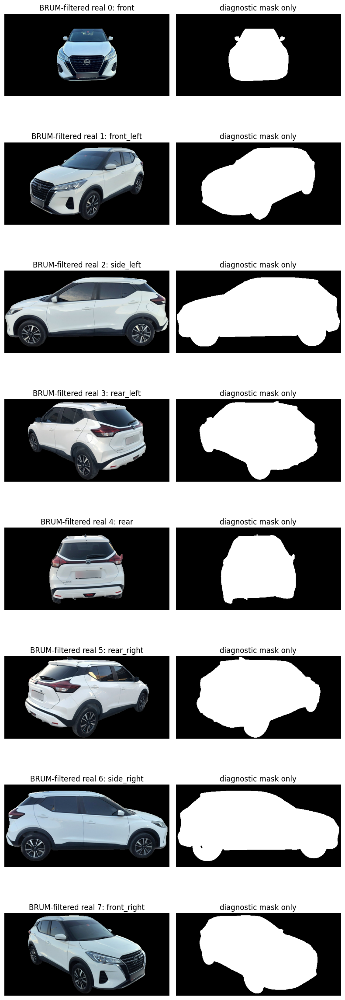

In [6]:

# Original BRUM-filtered inputs and masks
def show_real_inputs(n=None):
    n = len(real_image_names) if n is None else min(n, len(real_image_names))
    fig, axes = plt.subplots(n, 2, figsize=(8, 3*n))
    if n == 1:
        axes = axes[None, :]
    for i in range(n):
        img = Image.open(SCENE_ROOT / 'images' / real_image_names[i]).convert('RGB')
        axes[i,0].imshow(img); axes[i,0].set_title(f'BRUM-filtered real {i}: {views[i]}'); axes[i,0].axis('off')
        mp = SCENE_ROOT / 'real_object_masks_for_diagnostics_only' / real_image_names[i]
        if mp.exists():
            axes[i,1].imshow(Image.open(mp).convert('L'), cmap='gray'); axes[i,1].set_title('diagnostic mask only')
        else:
            axes[i,1].text(0.5, 0.5, 'no mask', ha='center')
        axes[i,1].axis('off')
    plt.tight_layout(); plt.show()

show_real_inputs(n=min(8, len(real_image_names)))


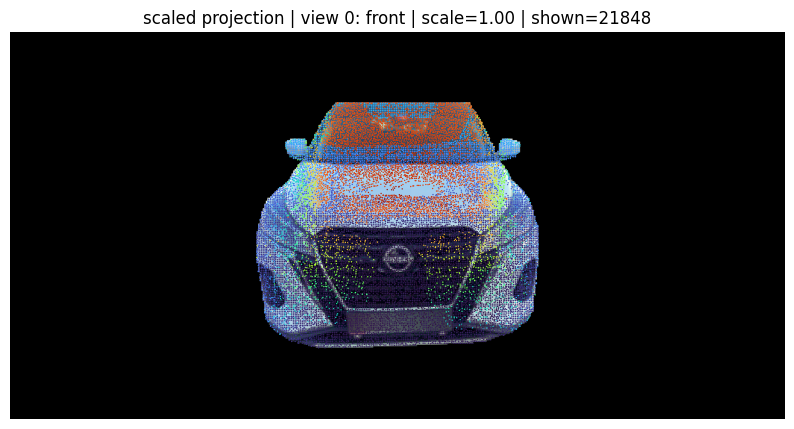

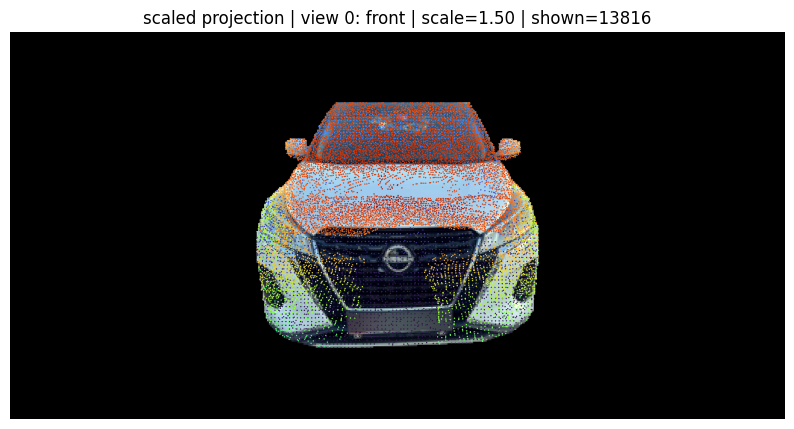

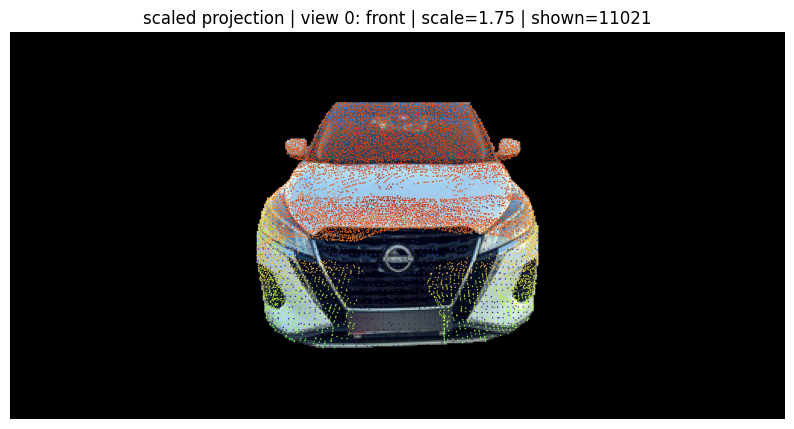

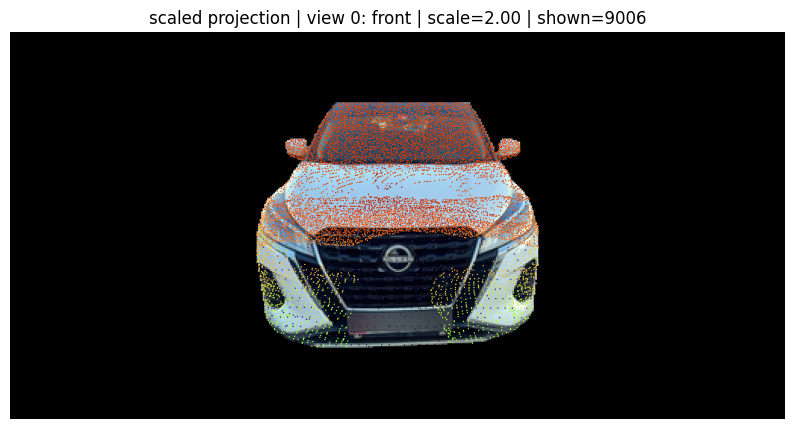

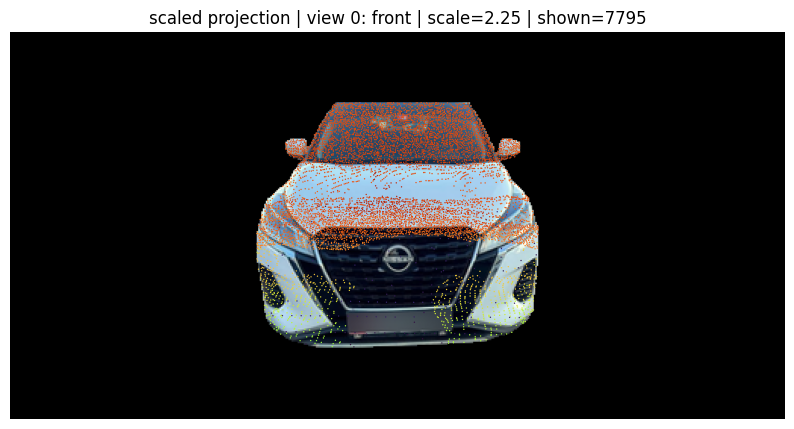

...

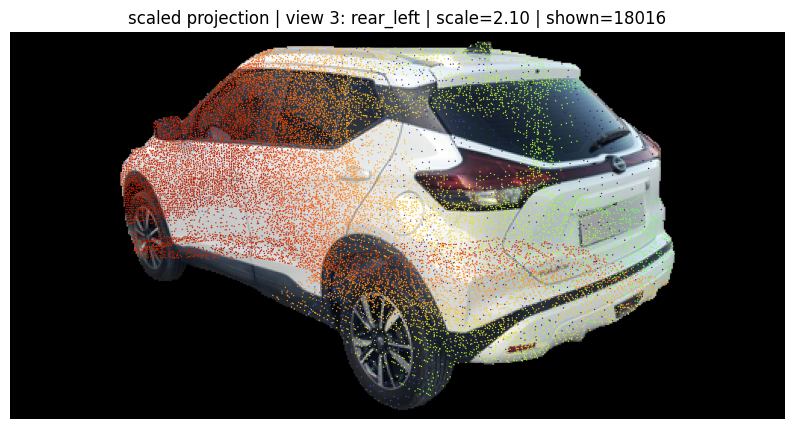

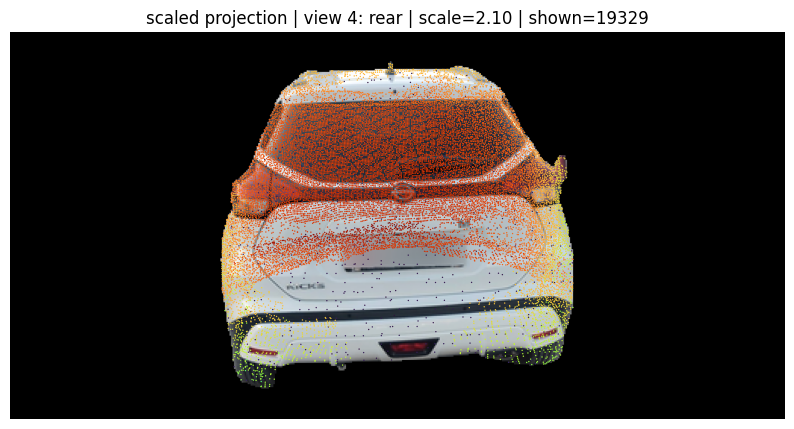

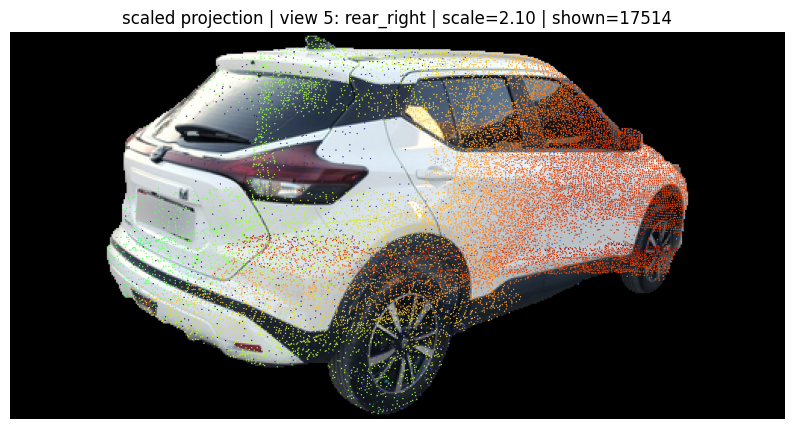

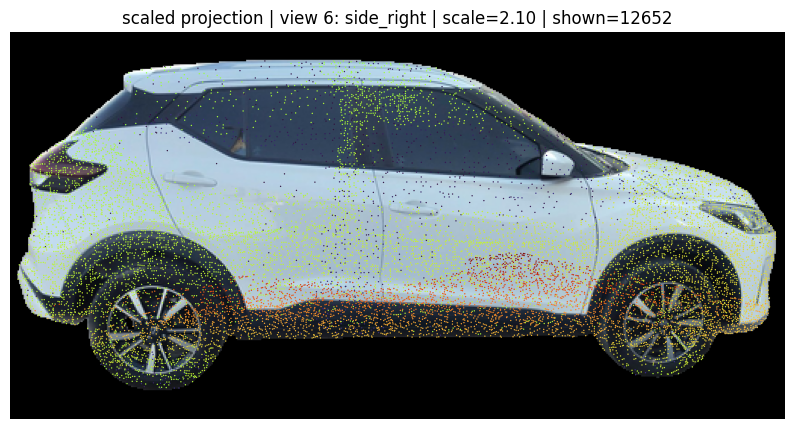

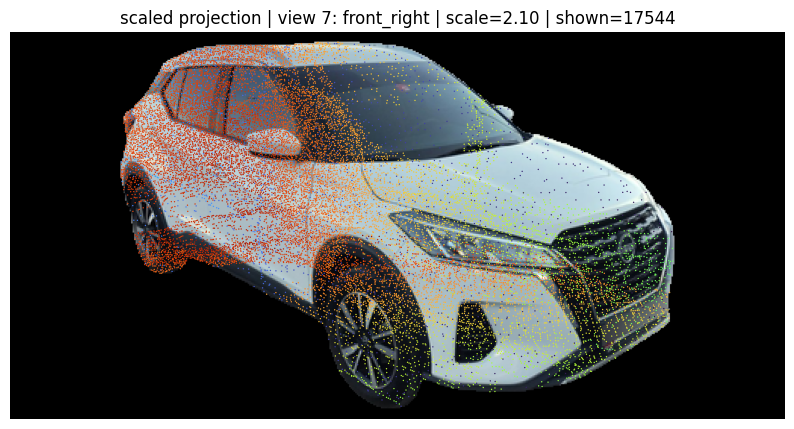

In [7]:
# --- Projection with visual point-cloud scale correction ---

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

def make_scaled_xyz_for_visual(scale=2.0):
    pts = np.asarray(xyz, dtype=np.float64)
    pts = pts[np.isfinite(pts).all(axis=1)]
    center = pts.mean(axis=0)
    return center + scale * (pts - center)

def project_points_scaled_on_car(
    img_idx=0,
    scale=2.0,
    max_points=300000,
    point_size=1,
    pixel_stride=1,
    mask_threshold=127,
):
    K = np.asarray(K_list[img_idx], dtype=np.float64)
    P = np.asarray(P_list[img_idx], dtype=np.float64)
    W, H = map(int, image_sizes_wh[img_idx])

    pts_w = make_scaled_xyz_for_visual(scale=scale)

    if len(pts_w) > max_points:
        rng = np.random.default_rng(123)
        pts_w = pts_w[rng.choice(len(pts_w), max_points, replace=False)]

    # world/object -> camera
    pts_c = (P[:3, :3] @ pts_w.T + P[:3, 3:4]).T
    z = pts_c[:, 2]

    front = z > 1e-6
    pts_c = pts_c[front]
    z = z[front]

    uv_h = (K @ pts_c.T).T
    u = uv_h[:, 0] / uv_h[:, 2]
    v = uv_h[:, 1] / uv_h[:, 2]

    inside = (u >= 0) & (u < W) & (v >= 0) & (v < H)
    u, v, z = u[inside], v[inside], z[inside]

    # Optional object-mask filtering for visualization only
    mask_dir = SCENE_ROOT / "real_object_masks_for_diagnostics_only"
    mask_path = mask_dir / real_image_names[img_idx]

    if mask_path.exists():
        mask = Image.open(mask_path).convert("L")
        if mask.size != (W, H):
            mask = mask.resize((W, H), Image.NEAREST)
        mask = np.asarray(mask)

        ui0 = np.clip(np.round(u).astype(int), 0, W - 1)
        vi0 = np.clip(np.round(v).astype(int), 0, H - 1)

        on_object = mask[vi0, ui0] > mask_threshold
        u, v, z = u[on_object], v[on_object], z[on_object]

    # Z-buffer: nearest point per pixel bin
    if len(u) > 0:
        ui = (u / pixel_stride).astype(np.int32)
        vi = (v / pixel_stride).astype(np.int32)
        grid_w = int(np.ceil(W / pixel_stride))
        key = vi * grid_w + ui

        order = np.lexsort((z, key))
        key_sorted = key[order]
        keep_sorted = np.r_[True, key_sorted[1:] != key_sorted[:-1]]
        keep = order[keep_sorted]
    else:
        keep = np.array([], dtype=int)

    img = np.asarray(
        Image.open(SCENE_ROOT / "images" / real_image_names[img_idx]).convert("RGB")
    )

    plt.figure(figsize=(10, 7))
    plt.imshow(img)

    if len(keep) > 0:
        plt.scatter(
            u[keep],
            v[keep],
            c=z[keep],
            s=point_size,
            cmap="turbo",
            alpha=0.95,
            linewidths=0,
        )

    plt.title(
        f"scaled projection | view {img_idx}: {views[img_idx]} | "
        f"scale={scale:.2f} | shown={len(keep)}"
    )
    plt.axis("off")
    plt.show()


# Try several scales on one view first
for s in [1.0, 1.5, 1.75, 2.0, 2.25]:
    project_points_scaled_on_car(
        img_idx=0,
        scale=s,
        point_size=1,
        pixel_stride=1,
    )

# Then inspect all views with the best scale
BEST_VIS_SCALE = 2.1

for idx in range(min(8, len(K_list))):
    project_points_scaled_on_car(
        img_idx=idx,
        scale=BEST_VIS_SCALE,
        point_size=1,
        pixel_stride=1,
    )

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics/generated_supervision_slerp_depth_grid.png


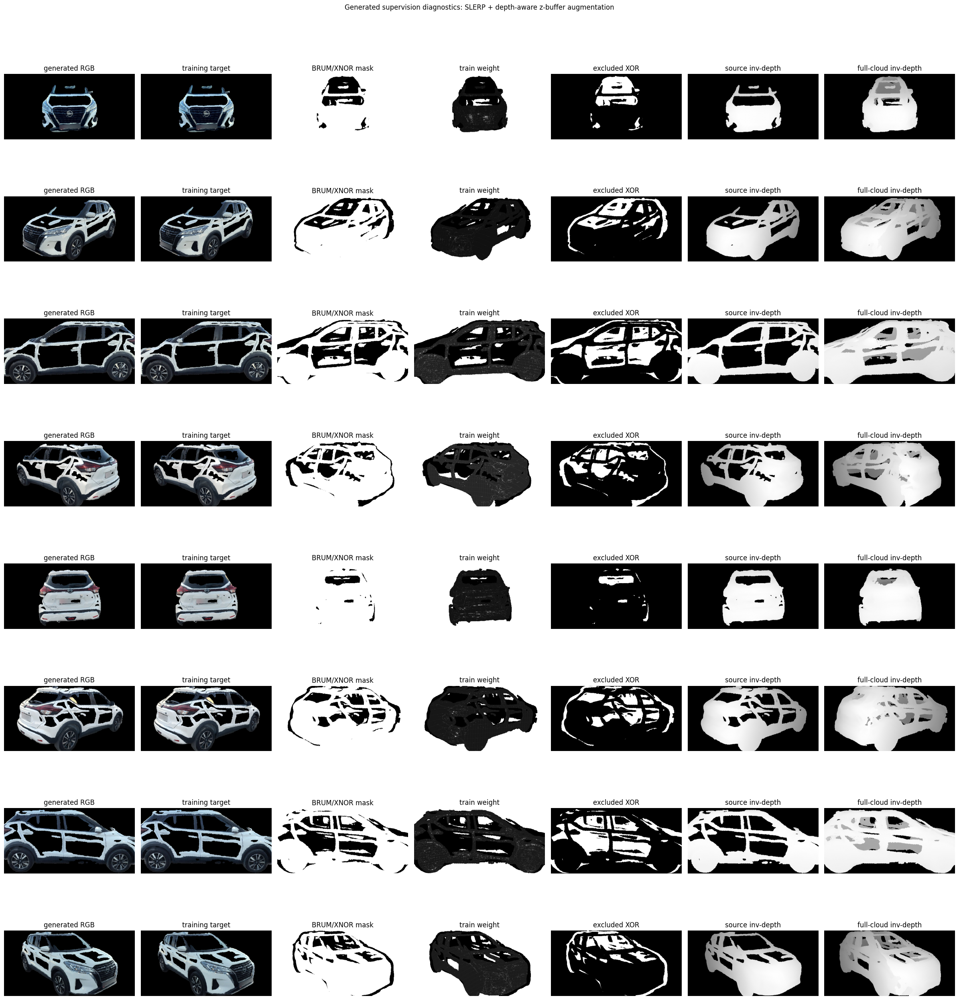

,source_view,helper_view,ring_direction,h,pose_interpolation,rendering_mode,n_projected_points_inside,n_full_cloud_points_inside,train_mask_frac,train_weight_frac,mean_train_weight_positive
0,front,front_right,prev,0.025,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.900864,0.900864,0.818976
1,front,front_right,prev,0.050,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.899498,0.899498,0.815281
2,front,front_right,prev,0.075,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.897827,0.897827,0.817208
3,front,front_right,prev,0.080,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.897514,0.897514,0.810471
4,front,front_left,next,0.025,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.900047,0.900047,0.820406
5,front,front_left,next,0.050,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.897697,0.897697,0.815808
6,front,front_left,next,0.075,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.896126,0.896126,0.813739
7,front,front_left,next,0.080,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,14823,302828,0.895432,0.895432,0.812250
8,front_left,front,prev,0.025,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,37129,302828,0.858604,0.858604,0.640393
9,front_left,front,prev,0.050,translation_linear_rotation_slerp,depth_aware_zbuffer_splatting,37129,302828,0.856758,0.856758,0.629346


,count,mean,std,min,25%,50%,75%,max
h,64.0,0.057500,0.022111,0.025000,0.043750,0.062500,0.076250,0.080000
n_projected_points_inside,64.0,37101.359375,9329.515761,14823.000000,35831.000000,41001.500000,42879.750000,44798.000000
n_full_cloud_points_inside,64.0,289412.046875,23295.844524,243494.000000,290217.000000,302743.000000,302828.000000,302828.000000
train_mask_frac,64.0,0.843802,0.072425,0.711624,0.815134,0.855042,0.877710,0.963478
train_weight_frac,64.0,0.843802,0.072425,0.711624,0.815134,0.855042,0.877710,0.963478
mean_train_weight_positive,64.0,0.599061,0.117919,0.433004,0.506986,0.585186,0.664606,0.820406


Generated records: 64


In [8]:
def _load_gray_optional(path):
    if path and Path(path).exists():
        return np.asarray(Image.open(path).convert('L'))
    return None


def _load_depth_vis_from_record(r, key_npy, key_vis):
    # Prefer stored visualization; fall back to inverse-depth rendering from .npy.
    if key_vis in r and Path(r[key_vis]).exists():
        return np.asarray(Image.open(r[key_vis]).convert('L'))
    if key_npy in r and Path(r[key_npy]).exists():
        d = np.load(r[key_npy])
        inv = np.where(np.isfinite(d) & (d > 0), 1.0 / np.maximum(d, 1e-6), 0.0)
        inv = inv - np.nanmin(inv)
        inv = inv / (np.nanmax(inv) + 1e-9)
        return (inv * 255).astype(np.uint8)
    return None


def show_generated_supervision(k=6, save=True):
    records = json.loads((SCENE_ROOT / "generated_manifest_brum_soft_weighted.json").read_text())
    k = min(k, len(records))
    pick = np.linspace(0, len(records) - 1, k, dtype=int)

    fig, axes = plt.subplots(k, 7, figsize=(24, 3.2*k))
    if k == 1:
        axes = axes[None, :]

    for row, ridx in enumerate(pick):
        r = records[int(ridx)]

        clean = Image.open(r.get("clean_image_path", r["image_path"])).convert("RGB")
        train = Image.open(r["image_path"]).convert("RGB")
        mask = Image.open(r["train_mask_path"]).convert("L")
        weight = Image.open(r.get("train_weight_path", r.get("weight_path"))).convert("L")
        inconsistent = _load_gray_optional(r.get('inconsistent_mask_path'))
        source_depth_vis = _load_depth_vis_from_record(r, 'source_depth_path', 'source_depth_vis_path')
        full_depth_vis = _load_depth_vis_from_record(r, 'full_depth_path', 'full_depth_vis_path')

        axes[row, 0].imshow(clean)
        axes[row, 0].set_title("generated RGB")
        axes[row, 1].imshow(train)
        axes[row, 1].set_title("training target")
        axes[row, 2].imshow(mask, cmap="gray")
        axes[row, 2].set_title("BRUM/XNOR mask")
        axes[row, 3].imshow(weight, cmap="gray")
        axes[row, 3].set_title("train weight")
        axes[row, 4].imshow(inconsistent if inconsistent is not None else np.zeros((BRUM_H, BRUM_W)), cmap="gray")
        axes[row, 4].set_title("excluded XOR")
        axes[row, 5].imshow(source_depth_vis if source_depth_vis is not None else np.zeros((BRUM_H, BRUM_W)), cmap="gray")
        axes[row, 5].set_title("source inv-depth")
        axes[row, 6].imshow(full_depth_vis if full_depth_vis is not None else np.zeros((BRUM_H, BRUM_W)), cmap="gray")
        axes[row, 6].set_title("full-cloud inv-depth")

        label = (
            f"{r['source_view']}→{r['helper_view']} h={float(r['h']):.3f}\n"
            f"interp={r.get('pose_interpolation','?')} | render={r.get('rendering_mode','?')}\n"
            f"mask={float(r.get('train_mask_frac', r.get('brum_valid_frac', 0))):.3f}, "
            f"weight={float(r.get('train_weight_frac', 0)):.3f}"
        )
        axes[row, 0].set_ylabel(label, fontsize=8)
        for col in range(7):
            axes[row, col].axis('off')

    plt.suptitle('Generated supervision diagnostics: SLERP + depth-aware z-buffer augmentation', y=1.01)
    plt.tight_layout()
    if save:
        out = DIAG_ROOT / 'generated_supervision_slerp_depth_grid.png'
        fig.savefig(out, dpi=160, bbox_inches='tight')
        print('Saved:', out)
    plt.show()

show_generated_supervision(k=8)

# Aggregate generated-view diagnostics table.
gen_records = json.loads((SCENE_ROOT / "generated_manifest_brum_soft_weighted.json").read_text())
df_gen = pd.DataFrame(gen_records)
cols = [
    'source_view', 'helper_view', 'ring_direction', 'h',
    'pose_interpolation', 'rendering_mode',
    'n_projected_points_inside', 'n_full_cloud_points_inside',
    'train_mask_frac', 'train_weight_frac', 'mean_train_weight_positive',
]
cols = [c for c in cols if c in df_gen.columns]
display(df_gen[cols].head(12))
summary_cols = [c for c in ['h', 'n_projected_points_inside', 'n_full_cloud_points_inside', 'train_mask_frac', 'train_weight_frac', 'mean_train_weight_positive'] if c in df_gen.columns]
display(df_gen[summary_cols].describe().T)
df_gen[cols].to_csv(DIAG_ROOT / 'generated_supervision_manifest_diagnostics.csv', index=False)
print('Generated records:', len(df_gen))


## 5. Write BRUM training script

In [9]:
TRAIN_SCRIPT.write_text(r"""
import os, sys, json, random
from pathlib import Path
from argparse import ArgumentParser
import numpy as np
from PIL import Image
import torch
import torch.nn.functional as F

from arguments import ModelParams, PipelineParams, OptimizationParams
from scene import Scene, GaussianModel
from gaussian_renderer import render, network_gui
from utils.general_utils import safe_state
from utils.graphics_utils import getWorld2View2, getProjectionMatrix, focal2fov
from utils.loss_utils import l1_loss, ssim
from train import prepare_output_and_logger, SPARSE_ADAM_AVAILABLE


def load_u8_rgb(path):
    arr = np.asarray(Image.open(path).convert("RGB"), dtype=np.float32) / 255.0
    return torch.from_numpy(arr).permute(2, 0, 1).contiguous()


def load_gray01(path):
    arr = np.asarray(Image.open(path).convert("L"), dtype=np.float32) / 255.0
    return torch.from_numpy(arr)[None, ...].contiguous()


def resize_mask_like(mask, image, mode="nearest"):
    if mask.shape[-2:] != image.shape[-2:]:
        mask = F.interpolate(
            mask[None],
            size=image.shape[-2:],
            mode=mode,
            align_corners=False if mode == "bilinear" else None,
        )[0]
    return mask


def masked_weighted_l1(rendered, target, mask, weight=None, eps=1e-6, normalize_by_mask=True):
    mask = (mask > 0.5).float()

    if weight is None:
        weight = torch.ones_like(mask)
    else:
        weight = weight.clamp(0.0, 1.0)

    err = torch.abs(rendered - target) * mask * weight

    if normalize_by_mask:
        # BRUM-style generated loss: selective masked weighted L1.
        # The denominator is the valid-mask pixel count, matching this implementation
        # of the BRUM paper objective, not the sum of weights.
        denom = torch.clamp(mask.sum() * rendered.shape[0], min=eps)
    else:
        denom = torch.clamp((mask * weight).sum() * rendered.shape[0], min=eps)

    return err.sum() / denom


def masked_real_loss(rendered, target, mask, lambda_dssim):
    # Real images are foreground-filtered full canvas. Loss is foreground-masked.
    mask = (mask > 0.5).float()
    l1 = masked_weighted_l1(rendered, target, mask, None, normalize_by_mask=True)

    # Masked-image DSSIM: no generated SSIM anywhere; this function is real-only.
    dssim = 1.0 - ssim(rendered * mask, target * mask)
    return (1.0 - float(lambda_dssim)) * l1 + float(lambda_dssim) * dssim


def standard_3dgs_loss(rendered, target, lambda_dssim):
    return (
        (1.0 - float(lambda_dssim)) * l1_loss(rendered, target)
        + float(lambda_dssim) * (1.0 - ssim(rendered, target))
    )


class GeneratedCamera:
    def __init__(self, rec, data_device="cuda"):
        self.uid = int(rec.get("uid", rec.get("source_idx", 0)))
        self.image_name = Path(rec["image_path"]).stem
        self.colmap_id = -1
        self.data_device = data_device

        img = load_u8_rgb(rec["image_path"])
        self.original_image = img.to(data_device)
        self.image_height = int(img.shape[1])
        self.image_width = int(img.shape[2])

        K = np.asarray(rec["K"], dtype=np.float32)
        expected_K = np.array([[512., 0., 256.], [0., 512., 128.], [0., 0., 1.]], dtype=np.float32)
        if not np.allclose(K, expected_K, atol=1e-4):
            raise ValueError(f"Generated K mismatch: {K}")

        fx, fy = float(K[0, 0]), float(K[1, 1])
        self.FoVx = float(focal2fov(fx, self.image_width))
        self.FoVy = float(focal2fov(fy, self.image_height))

        P_w2c = np.asarray(rec["P_w2c"], dtype=np.float32)
        R_w2c = P_w2c[:3, :3]
        t_w2c = P_w2c[:3, 3]

        self.R = R_w2c.T
        self.T = t_w2c

        self.znear = 0.01
        self.zfar = 100.0
        self.trans = np.array([0.0, 0.0, 0.0], dtype=np.float32)
        self.scale = 1.0

        self.world_view_transform = torch.tensor(
            getWorld2View2(self.R, self.T, self.trans, self.scale),
            dtype=torch.float32,
        ).transpose(0, 1).to(data_device)

        self.projection_matrix = getProjectionMatrix(
            znear=self.znear,
            zfar=self.zfar,
            fovX=self.FoVx,
            fovY=self.FoVy,
        ).transpose(0, 1).to(data_device)

        self.full_proj_transform = (
            self.world_view_transform.unsqueeze(0)
            .bmm(self.projection_matrix.unsqueeze(0))
            .squeeze(0)
        )

        self.camera_center = self.world_view_transform.inverse()[3, :3]

        if rec.get("generated_loss_policy_for_4B") != "masked_weighted_L1_only_no_generated_SSIM":
            raise ValueError("Generated record missing strict no-SSIM policy")

        mask_path = (
            rec.get("train_mask_path")
            or rec.get("xnor_mask_path")
            or rec.get("and_mask_path")
            or rec.get("source_mask_path")
        )
        if mask_path is None:
            raise ValueError(f"Generated record has no usable mask path: {rec.keys()}")

        self.brum_mask = resize_mask_like(
            load_gray01(mask_path).to(data_device),
            self.original_image,
            mode="nearest",
        )

        weight_path = rec.get("train_weight_path") or rec.get("weight_path")
        if weight_path and Path(weight_path).exists():
            self.brum_weight = load_gray01(weight_path).to(data_device)
            if self.brum_weight.shape[-2:] != self.original_image.shape[-2:]:
                self.brum_weight = F.interpolate(
                    self.brum_weight[None],
                    size=self.original_image.shape[-2:],
                    mode="bilinear",
                    align_corners=False,
                )[0]
            self.brum_weight = self.brum_weight.clamp(0.0, 1.0)
        else:
            self.brum_weight = torch.ones_like(self.brum_mask)

        if int((self.brum_mask > 0.5).sum().item()) <= 0:
            raise ValueError(f"Empty generated mask: {mask_path}")


def load_generated_cameras(path, data_device="cuda"):
    records = json.loads(Path(path).read_text())
    return [
        GeneratedCamera({**r, "uid": i}, data_device=data_device)
        for i, r in enumerate(records)
    ]


def parse_holdout_indices(s):
    return set(int(x.strip()) for x in str(s).split(",") if x.strip()) if s else set()


def camera_index_from_name(name):
    stem = Path(str(name)).stem
    for p in stem.split("_"):
        if p.isdigit():
            return int(p)
    return None


def load_real_mask_manifest(path):
    if path and Path(path).exists():
        data = json.loads(Path(path).read_text())
        return {str(k): str(v) for k, v in data.items()}
    return {}


def get_real_mask_for_camera(cam, manifest, data_device="cuda"):
    keys = [str(cam.image_name), Path(str(cam.image_name)).stem]
    if not str(cam.image_name).endswith(".png"):
        keys.append(str(cam.image_name) + ".png")
    path = None
    for k in keys:
        if k in manifest:
            path = manifest[k]
            break
    if path is None:
        return None
    m = load_gray01(path).to(data_device)
    return resize_mask_like(m, cam.original_image, mode="nearest")


def train_brum_strict_v7(dataset, opt, pipe, args):
    if (
        not SPARSE_ADAM_AVAILABLE
        and getattr(opt, "optimizer_type", "default") == "sparse_adam"
    ):
        print("Sparse Adam unavailable; using default optimizer.")
        opt.optimizer_type = "default"

    opt.saving_iterations = sorted(
        set([int(x) for x in getattr(opt, "saving_iterations", [])] + [int(opt.iterations)])
    )

    prepare_output_and_logger(dataset)

    try:
        gaussians = GaussianModel(dataset.sh_degree, opt.optimizer_type)
    except TypeError:
        gaussians = GaussianModel(dataset.sh_degree)

    scene = Scene(dataset, gaussians)
    gaussians.training_setup(opt)

    bg = torch.tensor(
        [1, 1, 1] if dataset.white_background else [0, 0, 0],
        dtype=torch.float32,
        device="cuda",
    )

    all_train_cams = scene.getTrainCameras().copy()
    holdout = parse_holdout_indices(args.holdout_indices)

    if holdout:
        all_train_cams = [
            c for c in all_train_cams
            if camera_index_from_name(c.image_name) not in holdout
        ]
        print(f"Held out real indices: {sorted(holdout)} | real train cameras: {len(all_train_cams)}")
    else:
        print(f"Real train cameras: {len(all_train_cams)}")

    if len(all_train_cams) == 0:
        raise RuntimeError("No real train cameras after holdout filtering")

    gen_cams = (
        load_generated_cameras(args.brum_manifest, data_device="cuda")
        if args.brum_manifest
        else []
    )

    real_mask_manifest = load_real_mask_manifest(args.brum_real_mask_manifest)
    real_mask_cache = {}

    print(f"Generated BRUM cameras: {len(gen_cams)}")
    print("Loss policy:")
    if args.brum_use_real_masked_loss:
        print("  real      = foreground-masked L1 + masked-image DSSIM")
    else:
        print("  real      = standard 3DGS L1 + DSSIM")
    print("  generated = masked weighted L1 ONLY; no generated SSIM/DSSIM")
    print(f"  generated_loss_scale={args.brum_lambda_gen} (1.0 = no extra downweight), gen_every={args.brum_gen_every}, use_weight={args.brum_use_weight}")


    if abs(float(args.brum_lambda_gen) - 1.0) > 1e-8:
        print("WARNING: brum_lambda_gen is not 1.0; this is no longer the paper-style unscaled generated term.")

    viewpoint_stack = all_train_cams.copy()
    ema = 0.0
    progress_every = max(1, int(args.progress_every))
    loss_log = []

    for iteration in range(1, int(opt.iterations) + 1):
        if not args.disable_viewer and network_gui.conn is None:
            network_gui.try_connect()

        gaussians.update_learning_rate(iteration)

        if iteration % 1000 == 0:
            gaussians.oneupSHdegree()

        if not viewpoint_stack:
            viewpoint_stack = all_train_cams.copy()

        viewpoint_cam = viewpoint_stack.pop(random.randint(0, len(viewpoint_stack) - 1))
        background = torch.rand((3), device="cuda") if opt.random_background else bg

        render_pkg = render(
            viewpoint_cam,
            gaussians,
            pipe,
            background,
            use_trained_exp=getattr(dataset, "train_test_exp", False),
            separate_sh=SPARSE_ADAM_AVAILABLE,
        )

        image = render_pkg["render"]
        gt = viewpoint_cam.original_image.cuda()

        if args.brum_use_real_masked_loss:
            cname = str(viewpoint_cam.image_name)
            if cname not in real_mask_cache:
                real_mask_cache[cname] = get_real_mask_for_camera(viewpoint_cam, real_mask_manifest, data_device="cuda")
            real_mask = real_mask_cache[cname]
            if real_mask is None:
                real_loss = standard_3dgs_loss(image, gt, getattr(opt, "lambda_dssim", 0.2))
            else:
                real_loss = masked_real_loss(image, gt, real_mask, getattr(opt, "lambda_dssim", 0.2))
        else:
            real_loss = standard_3dgs_loss(image, gt, getattr(opt, "lambda_dssim", 0.2))

        loss = real_loss
        gen_loss = torch.tensor(0.0, device="cuda")

        if gen_cams and args.brum_gen_every > 0 and (iteration % args.brum_gen_every == 0):
            gen_cam = random.choice(gen_cams)

            gen_render = render(
                gen_cam,
                gaussians,
                pipe,
                background,
                use_trained_exp=getattr(dataset, "train_test_exp", False),
                separate_sh=SPARSE_ADAM_AVAILABLE,
            )["render"]

            gen_loss = masked_weighted_l1(
                gen_render,
                gen_cam.original_image,
                gen_cam.brum_mask,
                gen_cam.brum_weight if args.brum_use_weight else None,
                normalize_by_mask=True,
            )

            loss = loss + float(args.brum_lambda_gen) * gen_loss

        loss.backward()

        with torch.no_grad():
            ema = 0.4 * float(loss.item()) + 0.6 * ema

            if iteration % progress_every == 0:
                msg_real = "real_masked" if args.brum_use_real_masked_loss else "real_standard"
                print(
                    f"iter {iteration:06d} | total {ema:.5f} | "
                    f"{msg_real} {real_loss.item():.5f} | "
                    f"gen_weighted_l1_no_ssim {gen_loss.item():.5f}"
                )
                loss_log.append({
                    "iteration": int(iteration),
                    "ema_total_loss": float(ema),
                    "real_loss": float(real_loss.item()),
                    "gen_weighted_l1_no_ssim": float(gen_loss.item()),
                    "lambda_gen": float(args.brum_lambda_gen),
                    "use_real_masked_loss": bool(args.brum_use_real_masked_loss),
                    "use_generated_weight": bool(args.brum_use_weight),
                })

            if iteration in opt.saving_iterations:
                print(f"\n[ITER {iteration}] Saving Gaussians")
                scene.save(iteration)

            if iteration < opt.densify_until_iter:
                gaussians.max_radii2D[render_pkg["visibility_filter"]] = torch.max(
                    gaussians.max_radii2D[render_pkg["visibility_filter"]],
                    render_pkg["radii"][render_pkg["visibility_filter"]],
                )

                gaussians.add_densification_stats(
                    render_pkg["viewspace_points"],
                    render_pkg["visibility_filter"],
                )

                if iteration > opt.densify_from_iter and iteration % opt.densification_interval == 0:
                    size_threshold = 20 if iteration > opt.opacity_reset_interval else None
                    gaussians.densify_and_prune(
                        opt.densify_grad_threshold,
                        0.005,
                        scene.cameras_extent,
                        size_threshold,
                        render_pkg.get("radii", None),
                    )

                if (
                    iteration % opt.opacity_reset_interval == 0
                    or (dataset.white_background and iteration == opt.densify_from_iter)
                ):
                    gaussians.reset_opacity()

            if iteration < opt.iterations:
                gaussians.exposure_optimizer.step()
                gaussians.exposure_optimizer.zero_grad(set_to_none=True)

                if (
                    getattr(opt, "optimizer_type", "default") == "sparse_adam"
                    and SPARSE_ADAM_AVAILABLE
                ):
                    visible = render_pkg["visibility_filter"]
                    gaussians.optimizer.step(visible, render_pkg["radii"].shape[0])
                    gaussians.optimizer.zero_grad(set_to_none=True)
                else:
                    gaussians.optimizer.step()
                    gaussians.optimizer.zero_grad(set_to_none=True)

    if loss_log:
        try:
            import csv
            out_csv = Path(dataset.model_path) / "brum_training_loss_log.csv"
            with out_csv.open("w", newline="") as f:
                writer = csv.DictWriter(f, fieldnames=list(loss_log[0].keys()))
                writer.writeheader()
                writer.writerows(loss_log)
            print("Saved training loss log:", out_csv)
        except Exception as e:
            print("WARNING: could not save loss log:", e)
    print("Training complete.")


if __name__ == "__main__":
    parser = ArgumentParser(
        description="All-data BRUM training: standard real 3DGS loss + generated selective masked weighted L1 only"
    )

    lp = ModelParams(parser)
    op = OptimizationParams(parser)
    pp = PipelineParams(parser)

    parser.add_argument("--ip", type=str, default="127.0.0.1")
    parser.add_argument("--port", type=int, default=6009)
    parser.add_argument("--detect_anomaly", action="store_true", default=False)
    parser.add_argument("--disable_viewer", action="store_true", default=True)
    parser.add_argument("--save_iterations", nargs="+", type=int, default=[])
    parser.add_argument("--test_iterations", nargs="+", type=int, default=[])
    parser.add_argument("--brum_manifest", type=str, required=True)
    parser.add_argument("--brum_real_mask_manifest", type=str, default="")
    parser.add_argument("--brum_lambda_gen", type=float, default=1.0)
    parser.add_argument("--brum_gen_every", type=int, default=1)
    parser.add_argument("--brum_use_weight", action="store_true")
    parser.add_argument("--brum_use_real_masked_loss", action="store_true")
    parser.add_argument("--progress_every", type=int, default=100)
    parser.add_argument("--holdout_indices", type=str, default="")

    args = parser.parse_args(sys.argv[1:])

    if args.iterations not in args.save_iterations:
        args.save_iterations.append(args.iterations)

    print("Optimizing", args.model_path)

    safe_state(False)
    torch.autograd.set_detect_anomaly(args.detect_anomaly)

    opt = op.extract(args)
    opt.saving_iterations = args.save_iterations

    train_brum_strict_v7(lp.extract(args), opt, pp.extract(args), args)
""")

print("Wrote strict v7 training script:", TRAIN_SCRIPT)

Wrote strict v7 training script: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/scripts/train_brum_strict_v8.py


## 6. Runtime helpers

In [10]:

def run_command(cmd, cwd=GS_REPO, check=True):
    env = os.environ.copy()
    env['PYTHONPATH'] = str(GS_REPO) + ':' + env.get('PYTHONPATH', '')
    print(' '.join(map(str, cmd)))
    r = subprocess.run(cmd, cwd=str(cwd), env=env, text=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT)
    print(r.stdout)
    if check and r.returncode != 0:
        raise RuntimeError(f'Command failed with code {r.returncode}')
    return r

def find_available_iteration(model_dir):
    its = []
    for p in (Path(model_dir) / 'point_cloud').glob('iteration_*'):
        if (p / 'point_cloud.ply').exists():
            its.append(int(p.name.replace('iteration_', '')))
    if not its:
        raise FileNotFoundError(f'No saved point_cloud.ply under {model_dir}/point_cloud')
    return max(its)

def write_cfg_args(model_dir, scene_root, sh_degree=3, white_background=False, eval_mode=False):
    model_dir = Path(model_dir)
    cfg_path = model_dir / 'cfg_args'
    txt = f'''Namespace(
sh_degree={sh_degree},
source_path='{scene_root}',
model_path='{model_dir}',
images='images',
depths='',
resolution=-1,
white_background={white_background},
train_test_exp=False,
data_device='cuda',
eval={eval_mode}
)'''
    cfg_path.write_text(txt)
    return cfg_path


## 7. Leave-one-out splits and ALLDATA-method manifest filtering


In [11]:
# Same evaluation logic: 8-fold leave-one-out over the 8 real images.
# v8 strict rule: keep the LOO test protocol from v7, but use the ALLDATA BRUMLOSS
# generated-manifest filtering method, with only the required held-out-camera exclusion added.
SPLITS = [{'name': f'fold_{i:02d}_test_{str(views[i]).replace("/", "_")}', 'test': [i]} for i in range(len(views))]
MODEL_ROOT.mkdir(parents=True, exist_ok=True)
EVAL_ROOT.mkdir(parents=True, exist_ok=True)
print('Number of LOO folds:', len(SPLITS))
print('First split:', SPLITS[0])

def make_split_manifest(split, out_path):
    hold = set(split['test'])
    records = json.loads((SCENE_ROOT / 'generated_manifest_brum_soft_weighted.json').read_text())
    filt = []
    for r in records:
        # LOO discipline retained from v7: generated view cannot use or interpolate
        # from the held-out real camera.
        ids = [r.get('source_idx'), r.get('helper_idx'), r.get('target_idx')]
        if any((x is not None and int(x) in hold) for x in ids):
            continue

        # ALLDATA BRUMLOSS filtering method starts here.
        rr = dict(r)
        rr['train_mask_path'] = rr.get('train_mask_path') or rr.get('xnor_mask_path') or rr.get('and_mask_path') or rr.get('source_mask_path')
        rr['train_weight_path'] = rr.get('train_weight_path') or rr.get('weight_path')

        if not rr.get('train_mask_path') or not Path(rr['train_mask_path']).exists():
            continue
        if not rr.get('train_weight_path') or not Path(rr['train_weight_path']).exists():
            continue
        if float(rr.get('h', 999.0)) > MAX_GENERATED_H:
            continue
        if int(rr.get('n_mask_pixels_train', 0)) < MIN_TRAIN_MASK_PIXELS:
            continue

        # Strict BRUM generated-loss policy for 4B training, matching ALLDATA.
        rr['generated_loss_policy_for_4B'] = 'masked_weighted_L1_only_no_generated_SSIM'
        filt.append(rr)

    out_path.parent.mkdir(parents=True, exist_ok=True)
    out_path.write_text(json.dumps(filt, indent=2))
    print(split['name'], '| generated train records:', len(filt), '/', len(records), '| held out:', sorted(hold))
    assert len(filt) > 0, f"No generated views left for {split['name']}; check 3A manifest/filtering."
    return out_path

# One diagnostic split manifest before training.
_ = make_split_manifest(SPLITS[0], EVAL_ROOT / SPLITS[0]['name'] / 'generated_manifest_train_preview.json')


Number of LOO folds: 8
First split: {'name': 'fold_00_test_front', 'test': [0]}
fold_00_test_front | generated train records: 48 / 64 | held out: [0]


## 8. Train one model per LOO split with ALLDATA BRUMLOSS method


In [12]:
split_runs = []
for split in SPLITS:
    print('\n====================', split['name'], '====================')
    model_dir = MODEL_ROOT / split['name']
    split_dir = EVAL_ROOT / split['name']
    split_dir.mkdir(parents=True, exist_ok=True)
    if OVERWRITE_MODEL and model_dir.exists():
        shutil.rmtree(model_dir)
    model_dir.mkdir(parents=True, exist_ok=True)

    split_manifest = make_split_manifest(split, split_dir / 'generated_manifest_train.json')

    cmd = [
        sys.executable, str(TRAIN_SCRIPT),
        '-s', str(SCENE_ROOT),
        '-m', str(model_dir),
        '--images', 'images',
        '--disable_viewer',
        '--iterations', str(ITERATIONS),
        '--save_iterations', str(ITERATIONS),
        '--sh_degree', str(SH_DEGREE),
        '--brum_manifest', str(split_manifest),
        '--brum_real_mask_manifest', str(SCENE_ROOT / 'real_mask_manifest.json'),
        '--brum_lambda_gen', str(BRUM_LAMBDA_GEN),
        '--brum_gen_every', str(BRUM_GEN_EVERY),
        '--progress_every', '100',
        '--holdout_indices', ','.join(map(str, split['test'])),
    ]
    if WHITE_BACKGROUND:
        cmd.append('--white_background')
    if RANDOM_BACKGROUND:
        cmd.append('--random_background')
    if USE_GENERATED_WEIGHT:
        cmd.append('--brum_use_weight')
    # BRUM ALLDATA applies the standard 3DGS loss to original images; do not enable real masked loss here.
    # if USE_REAL_MASKED_LOSS:
    #     cmd.append('--brum_use_real_masked_loss')

    run_command(cmd, cwd=GS_REPO)
    it = find_available_iteration(model_dir)
    write_cfg_args(model_dir, SCENE_ROOT, SH_DEGREE, WHITE_BACKGROUND, eval_mode=False)
    split_runs.append({'split': split, 'model_dir': model_dir, 'iteration': it, 'manifest': split_manifest})
    print('Saved split model:', model_dir, 'iteration:', it)

print('Trained folds:', len(split_runs))


==================== fold_00_test_front ====================
fold_00_test_front | generated train records: 48 / 64 | held out: [0]
/usr/bin/python3 /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/scripts/train_brum_strict_v8.py -s /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth -m /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v8_LOO_CV_ALLDATA_METHODS/fold_00_test_front --images images --disable_viewer --iterations 5000 --save_iterations 5000 --sh_degree 3 --brum_manifest /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/fold_00_test_front/generated_manifest_train.json --brum_real_mask_manifest /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth/real_

## 9. Render all original cameras for every split

In [13]:

for run in split_runs:
    model_dir = run['model_dir']
    it = run['iteration']
    # cfg_args has eval=False, so render.py treats all scene cameras as train cameras.
    # We render all original cameras, then evaluate only the held-out camera for this fold.
    cmd = [sys.executable, 'render.py', '-s', str(SCENE_ROOT), '-m', str(model_dir), '--iteration', str(it), '--skip_test']
    run_command(cmd, cwd=GS_REPO)


/usr/bin/python3 render.py -s /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth -m /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v8_LOO_CV_ALLDATA_METHODS/fold_00_test_front --iteration 5000 --skip_test
Looking for config file in /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v8_LOO_CV_ALLDATA_METHODS/fold_00_test_front/cfg_args
Config file found: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v8_LOO_CV_ALLDATA_METHODS/fold_00_test_front/cfg_args
Rendering /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v8_LOO_CV_ALLDATA_METHODS/fold_00_test_front
Loading trained model at iteration 5000 [11/05 07:55:56]

Reading camera 1/8
Reading camera 2/8
Reading camera 3/8
Read

## 10. Metrics:  full-image PSNR / SSIM / LPIPS / AVGE

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:01<00:00, 236MB/s]


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
Held-out LOO metrics:


,split,view_idx,view,is_heldout,gt,pred,PSNR,SSIM,LPIPS,AVGE
0,fold_00_test_front,0,front,True,real_00_front.png,00000.png,10.523219,0.491321,0.549428,0.291526
9,fold_01_test_front_left,1,front_left,True,real_01_front_left.png,00001.png,8.764110,0.380432,0.610955,0.369172
18,fold_02_test_side_left,2,side_left,True,real_02_side_left.png,00002.png,8.464346,0.209357,0.664940,0.421479
27,fold_03_test_rear_left,3,rear_left,True,real_03_rear_left.png,00003.png,10.617850,0.368089,0.556878,0.312519
36,fold_04_test_rear,4,rear,True,real_04_rear.png,00004.png,11.850867,0.591076,0.396028,0.219496
45,fold_05_test_rear_right,5,rear_right,True,real_05_rear_right.png,00005.png,9.521434,0.296271,0.612525,0.363744
54,fold_06_test_side_right,6,side_right,True,real_06_side_right.png,00006.png,9.025200,0.189146,0.680699,0.410323
63,fold_07_test_front_right,7,front_right,True,real_07_front_right.png,00007.png,9.474733,0.379462,0.605377,0.348691


Training-view render metrics from each fold:


,split,view_idx,view,is_heldout,gt,pred,PSNR,SSIM,LPIPS,AVGE
1,fold_00_test_front,1,front_left,False,real_01_front_left.png,00001.png,38.112912,0.989551,0.024379,0.003401
2,fold_00_test_front,2,side_left,False,real_02_side_left.png,00002.png,38.500893,0.990942,0.010974,0.002412
3,fold_00_test_front,3,rear_left,False,real_03_rear_left.png,00003.png,37.801487,0.991527,0.009355,0.002360
4,fold_00_test_front,4,rear,False,real_04_rear.png,00004.png,32.494576,0.986654,0.017003,0.005037
5,fold_00_test_front,5,rear_right,False,real_05_rear_right.png,00005.png,32.368298,0.979577,0.021455,0.006333


Held-out summary:


,PSNR,SSIM,LPIPS,AVGE
mean,9.780220,0.363144,0.584604,0.342119
std,1.136134,0.134891,0.088770,0.066187


Training-view summary:


,PSNR,SSIM,LPIPS,AVGE
mean,33.546476,0.982742,0.025620,0.006538
std,4.425272,0.009653,0.016589,0.004722


Generalization gap (heldout - train):


,train_mean,heldout_mean,heldout_minus_train
PSNR,33.546476,9.780220,-23.766256
SSIM,0.982742,0.363144,-0.619598
LPIPS,0.025620,0.584604,0.558984
AVGE,0.006538,0.342119,0.335581


Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/loo_all_real_views_metrics_psnr_ssim_lpips_avge.csv
Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics/train_vs_heldout_metrics.png


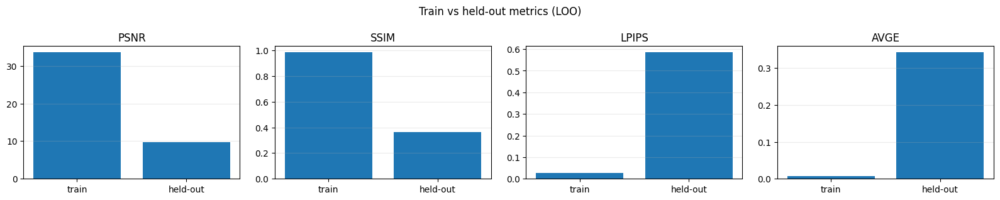

In [14]:
from skimage.metrics import structural_similarity as ssim_metric
import lpips, torch

lpips_fn = lpips.LPIPS(net='alex').cuda().eval()

def psnr_full(gt, pred):
    diff = (gt.astype(np.float32) / 255.0) - (pred.astype(np.float32) / 255.0)
    mse = float(np.mean(diff * diff))
    return -10 * np.log10(mse + 1e-8)

def ssim_full(gt, pred):
    return float(ssim_metric(gt, pred, channel_axis=2, data_range=255))

def lpips_full(gt, pred):
    def prep(x):
        t = torch.from_numpy(x.astype(np.float32) / 255.0).permute(2,0,1)[None].cuda()
        return t * 2 - 1
    with torch.no_grad():
        return float(lpips_fn(prep(gt), prep(pred)).item())

def avge_from_metrics(psnr, ssim, lpips_value):
    # BRUM-style unified score: geometric mean of MSE, DSSIM=(1-SSIM), and LPIPS.
    mse = 10 ** (-float(psnr) / 10.0)
    dssim = max(0.0, 1.0 - float(ssim))
    lp = max(0.0, float(lpips_value))
    return float((mse * dssim * lp) ** (1.0 / 3.0))

def find_render_for_gt(render_dir, gt_path, fallback_idx=None):
    candidates = list(render_dir.glob(gt_path.name)) or list(render_dir.glob(f'{gt_path.stem}*.png'))
    if candidates:
        return candidates[0]
    render_files = sorted(render_dir.glob('*.png'))
    assert fallback_idx is not None and fallback_idx < len(render_files), f'No render found for {gt_path.name}'
    return render_files[fallback_idx]

def compute_image_metrics(gt, pred):
    if pred.shape != gt.shape:
        pred = np.array(Image.fromarray(pred).resize((gt.shape[1], gt.shape[0]), Image.BILINEAR))
    psnr_v = psnr_full(gt, pred)
    ssim_v = ssim_full(gt, pred)
    lpips_v = lpips_full(gt, pred)
    avge_v = avge_from_metrics(psnr_v, ssim_v, lpips_v)
    return psnr_v, ssim_v, lpips_v, avge_v

rows = []
image_files = sorted((SCENE_ROOT / 'images').glob('*.png'))
for run in split_runs:
    split = run['split']
    model_dir = run['model_dir']
    it = run['iteration']
    render_dir = model_dir / 'train' / f'ours_{it}' / 'renders'
    assert render_dir.exists(), f'Missing render dir: {render_dir}'

    holdout = set(split['test'])
    for idx, gt_path in enumerate(image_files):
        pred_path = find_render_for_gt(render_dir, gt_path, fallback_idx=idx)
        gt = np.array(Image.open(gt_path).convert('RGB'))
        pred = np.array(Image.open(pred_path).convert('RGB'))
        psnr_v, ssim_v, lpips_v, avge_v = compute_image_metrics(gt, pred)
        rows.append({
            'split': split['name'],
            'view_idx': idx,
            'view': views[idx],
            'is_heldout': idx in holdout,
            'gt': gt_path.name,
            'pred': pred_path.name,
            'PSNR': psnr_v,
            'SSIM': ssim_v,
            'LPIPS': lpips_v,
            'AVGE': avge_v,
        })

df_eval_all = pd.DataFrame(rows)
df_eval = df_eval_all[df_eval_all['is_heldout']].copy()
df_train_render = df_eval_all[~df_eval_all['is_heldout']].copy()

print('Held-out LOO metrics:')
display(df_eval)
print('Training-view render metrics from each fold:')
display(df_train_render.head())

summary_holdout = df_eval[['PSNR', 'SSIM', 'LPIPS', 'AVGE']].agg(['mean', 'std'])
summary_train = df_train_render[['PSNR', 'SSIM', 'LPIPS', 'AVGE']].agg(['mean', 'std'])
print('Held-out summary:')
display(summary_holdout)
print('Training-view summary:')
display(summary_train)

gap = pd.DataFrame({
    'train_mean': summary_train.loc['mean'],
    'heldout_mean': summary_holdout.loc['mean'],
})
gap['heldout_minus_train'] = gap['heldout_mean'] - gap['train_mean']
print('Generalization gap (heldout - train):')
display(gap)

out_csv = EVAL_ROOT / 'loo_all_real_views_metrics_psnr_ssim_lpips_avge.csv'
df_eval_all.to_csv(out_csv, index=False)
df_eval.to_csv(EVAL_ROOT / 'loo_heldout_metrics_psnr_ssim_lpips_avge.csv', index=False)
df_train_render.to_csv(EVAL_ROOT / 'loo_trainview_render_metrics_psnr_ssim_lpips_avge.csv', index=False)
summary_holdout.to_csv(EVAL_ROOT / 'loo_heldout_metrics_summary.csv')
summary_train.to_csv(EVAL_ROOT / 'loo_trainview_metrics_summary.csv')
gap.to_csv(EVAL_ROOT / 'loo_train_vs_heldout_gap.csv')
print('Saved:', out_csv)

# BRUM-style compact bar plots.
fig, axes = plt.subplots(1, 4, figsize=(16, 3.2))
for ax, metric in zip(axes, ['PSNR', 'SSIM', 'LPIPS', 'AVGE']):
    ax.bar(['train', 'held-out'], [summary_train.loc['mean', metric], summary_holdout.loc['mean', metric]])
    ax.set_title(metric)
    ax.grid(axis='y', alpha=0.25)
plt.suptitle('Train vs held-out metrics (LOO)')
plt.tight_layout()
out = DIAG_ROOT / 'train_vs_heldout_metrics.png'
fig.savefig(out, dpi=160, bbox_inches='tight')
print('Saved:', out)
plt.show()


## 11. Visualize held-out GT, prediction, and error maps

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics/prediction_fold_00_test_front_view00_front.png


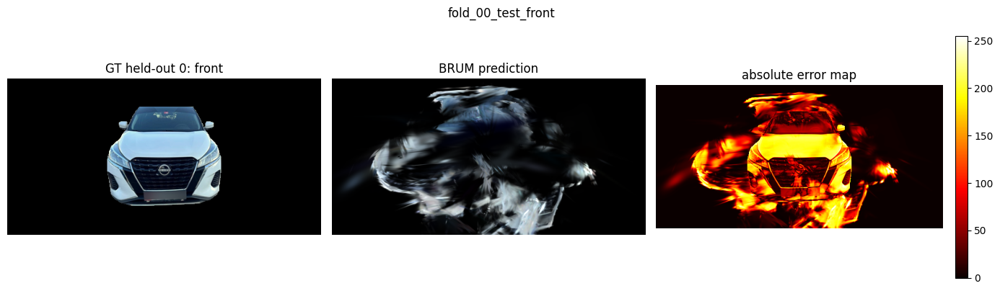

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics/prediction_fold_01_test_front_left_view01_front_left.png


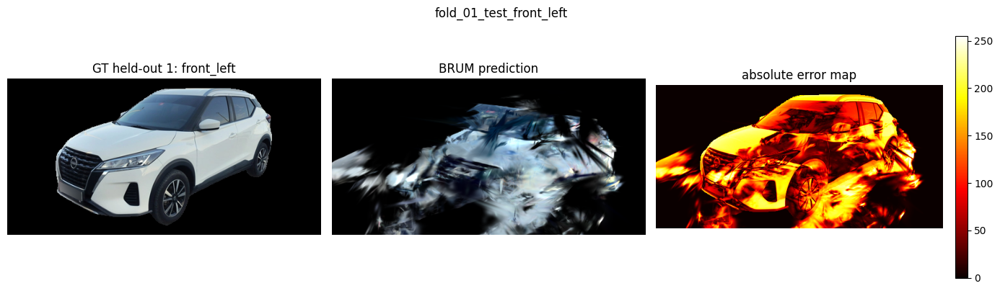

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics/prediction_fold_02_test_side_left_view02_side_left.png


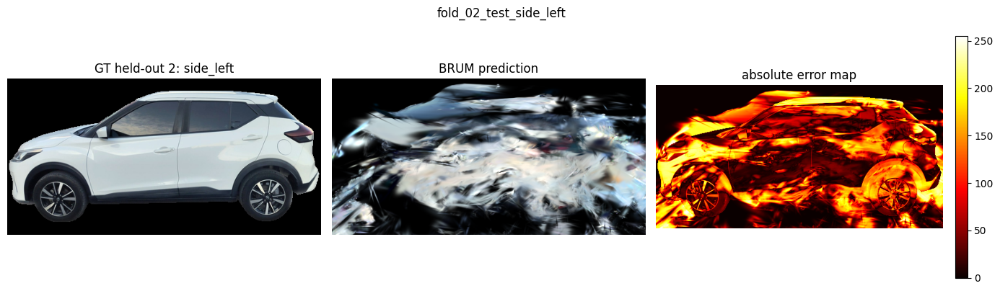

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics/prediction_fold_03_test_rear_left_view03_rear_left.png


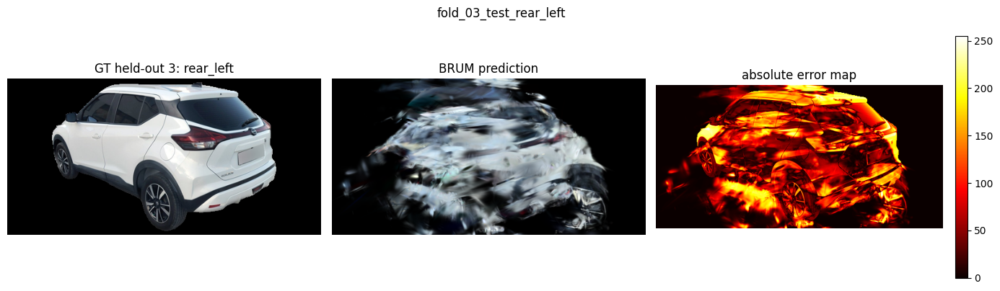

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics/prediction_fold_04_test_rear_view04_rear.png


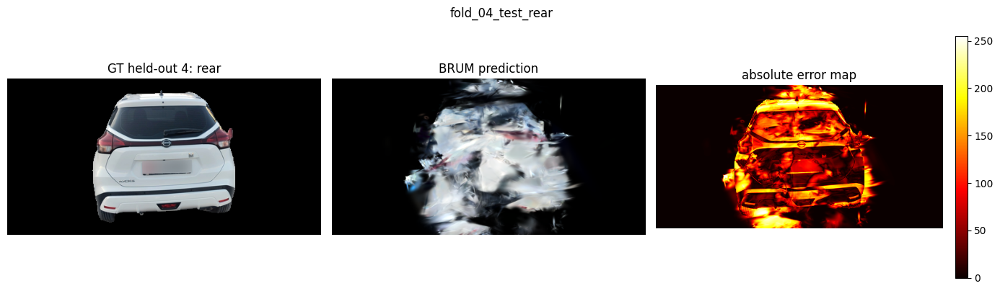

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics/prediction_fold_05_test_rear_right_view05_rear_right.png


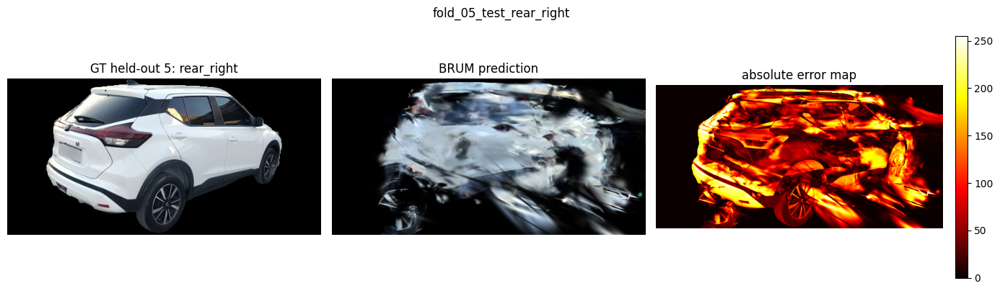

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics/prediction_fold_06_test_side_right_view06_side_right.png


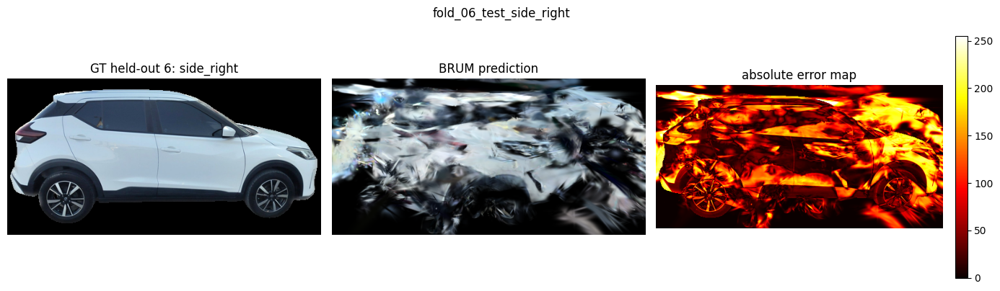

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics/prediction_fold_07_test_front_right_view07_front_right.png


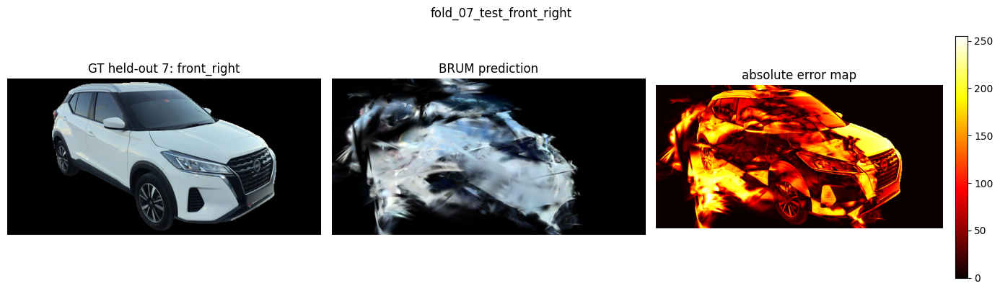

In [15]:

def show_predictions_for_runs(runs=None, max_folds=None):
    runs = split_runs if runs is None else runs
    if max_folds is not None:
        runs = runs[:max_folds]
    image_files = sorted((SCENE_ROOT / 'images').glob('*.png'))
    for run in runs:
        split = run['split']
        model_dir = run['model_dir']
        it = run['iteration']
        render_dir = model_dir / 'train' / f'ours_{it}' / 'renders'
        for idx in split['test']:
            gt_path = image_files[idx]
            pred_path = find_render_for_gt(render_dir, gt_path, fallback_idx=idx)
            gt = np.array(Image.open(gt_path).convert('RGB'))
            pred = np.array(Image.open(pred_path).convert('RGB'))
            if pred.shape != gt.shape:
                pred = np.array(Image.fromarray(pred).resize((gt.shape[1], gt.shape[0]), Image.BILINEAR))
            err = np.abs(pred.astype(np.float32) - gt.astype(np.float32)).mean(axis=-1)
            fig, axes = plt.subplots(1, 3, figsize=(14, 4))
            axes[0].imshow(gt); axes[0].set_title(f'GT held-out {idx}: {views[idx]}'); axes[0].axis('off')
            axes[1].imshow(pred); axes[1].set_title('BRUM prediction'); axes[1].axis('off')
            im = axes[2].imshow(err, cmap='hot'); axes[2].set_title('absolute error map'); axes[2].axis('off')
            plt.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
            plt.suptitle(split['name'])
            plt.tight_layout();
            out = DIAG_ROOT / f'prediction_{split["name"]}_view{idx:02d}_{views[idx]}.png'
            fig.savefig(out, dpi=160, bbox_inches='tight')
            print('Saved:', out)
            plt.show()

show_predictions_for_runs(max_folds=len(split_runs))


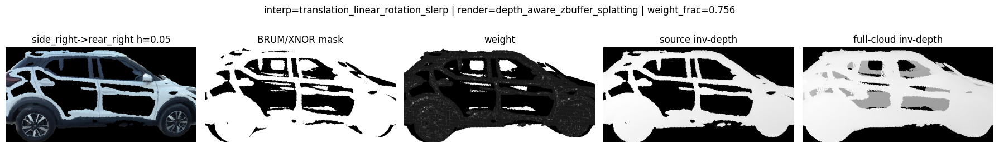

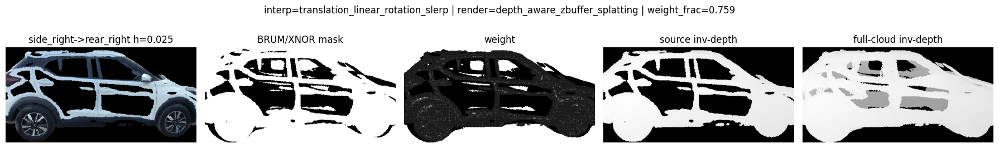

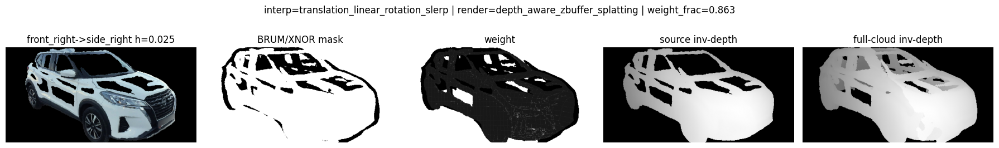

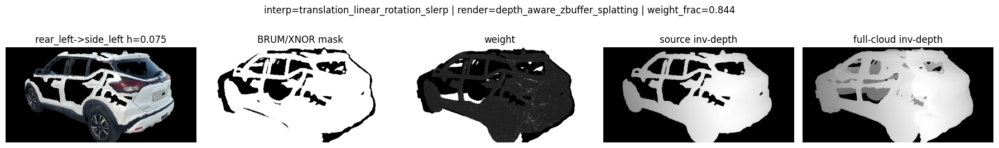

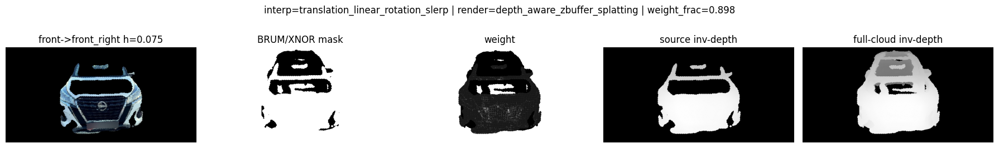

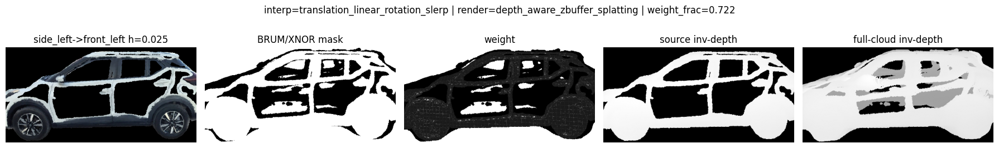

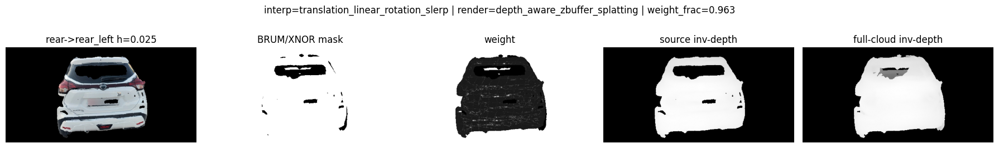

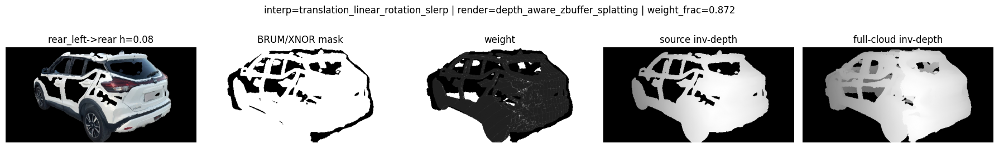

In [16]:
import json, random
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

records = json.loads((SCENE_ROOT / "generated_manifest_brum_soft_weighted.json").read_text())
random.seed(0)
for r in random.sample(records, min(8, len(records))):
    img = Image.open(r["image_path"]).convert("RGB")
    mask = Image.open(r["train_mask_path"]).convert("L")
    weight = Image.open(r["train_weight_path"]).convert("L")
    src_depth = Image.open(r.get("source_depth_vis_path", r["train_weight_path"])).convert("L") if r.get("source_depth_vis_path") else None
    full_depth = Image.open(r.get("full_depth_vis_path", r["train_weight_path"])).convert("L") if r.get("full_depth_vis_path") else None

    fig, ax = plt.subplots(1, 5, figsize=(18, 3))
    ax[0].imshow(img); ax[0].set_title(f'{r["source_view"]}->{r["helper_view"]} h={r["h"]}')
    ax[1].imshow(mask, cmap="gray"); ax[1].set_title("BRUM/XNOR mask")
    ax[2].imshow(weight, cmap="gray"); ax[2].set_title("weight")
    ax[3].imshow(src_depth if src_depth is not None else mask, cmap="gray"); ax[3].set_title("source inv-depth")
    ax[4].imshow(full_depth if full_depth is not None else mask, cmap="gray"); ax[4].set_title("full-cloud inv-depth")
    for a in ax: a.axis("off")
    plt.suptitle(f"interp={r.get('pose_interpolation')} | render={r.get('rendering_mode')} | weight_frac={float(r.get('train_weight_frac',0)):.3f}")
    plt.tight_layout()
    plt.show()


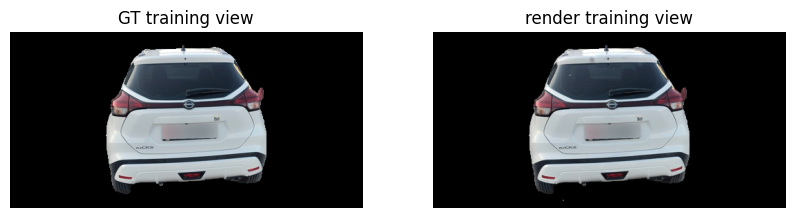

In [17]:
run = split_runs[5]  # for fold_05
model_dir = run["model_dir"]
it = run["iteration"]
render_dir = model_dir / "train" / f"ours_{it}" / "renders"

image_files = sorted((SCENE_ROOT / "images").glob("*.png"))

# show a non-heldout training view, e.g. idx 4 or 6
idx = 4
gt_path = image_files[idx]
pred_path = find_render_for_gt(render_dir, gt_path, fallback_idx=idx)

gt = np.array(Image.open(gt_path).convert("RGB"))
pred = np.array(Image.open(pred_path).convert("RGB"))

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(gt); plt.title("GT training view"); plt.axis("off")
plt.subplot(1,2,2); plt.imshow(pred); plt.title("render training view"); plt.axis("off")
plt.show()

## 11b. Render LOO-safe augmented trajectory video

This is the ALLDATA render/video diagnostic adapted to v8 LOO: it uses the selected fold's model and generated training manifest, so the held-out-camera exclusion remains intact.


In [18]:
# ============================================================
# Helper: render generated/augmented camera manifests
# v8 LOO-safe: uses the selected split model and split manifest
# ============================================================

import os, sys, json, random, subprocess, textwrap
from pathlib import Path

# Uses notebook variables:
# GS_REPO, SCENE_ROOT, split_runs
# Optional: set SELECT_FOLD_IDX = 0..7 before running this cell.

if 'split_runs' not in globals() or len(split_runs) == 0:
    raise RuntimeError('split_runs is empty. Run the LOO training cell first.')

SELECT_FOLD_IDX = int(globals().get('SELECT_FOLD_IDX', 0))
run = split_runs[SELECT_FOLD_IDX]
model_dir = Path(run['model_dir'])
it = int(run['iteration'])
manifest_path = Path(run['manifest'])

if not manifest_path.exists():
    raise RuntimeError(f'Selected split manifest does not exist: {manifest_path}')

AUG_RENDER_DIR = Path(model_dir) / 'renders_augmented_plus_random'
AUG_RENDER_DIR.mkdir(parents=True, exist_ok=True)

records = json.loads(manifest_path.read_text())
print('Selected fold:', run['split']['name'])
print('Model dir    :', model_dir)
print('Iteration    :', it)
print('Manifest     :', manifest_path)
print('Loaded generated camera records for this LOO fold:', len(records))

# ------------------------------------------------------------
# 3. Write a small render script using same GeneratedCamera logic
# ------------------------------------------------------------

RENDER_SELECTED_SCRIPT = Path(GS_REPO) / "render_selected_brum_views.py"

RENDER_SELECTED_SCRIPT.write_text(r"""
import sys, json
from pathlib import Path
from argparse import ArgumentParser
import numpy as np
from PIL import Image
import torch
import torch.nn.functional as F

from arguments import ModelParams, PipelineParams, get_combined_args
from scene import Scene, GaussianModel
from gaussian_renderer import render
from utils.graphics_utils import getWorld2View2, getProjectionMatrix, focal2fov
from utils.general_utils import safe_state


def load_u8_rgb(path):
    arr = np.asarray(Image.open(path).convert("RGB"), dtype=np.float32) / 255.0
    return torch.from_numpy(arr).permute(2, 0, 1).contiguous()


def save_rgb_tensor(img, path):
    img = img.detach().clamp(0, 1).cpu()
    arr = (img.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
    Image.fromarray(arr).save(path)


class GeneratedCamera:
    def __init__(self, rec, data_device="cuda"):
        self.uid = int(rec.get("uid", 0))
        self.image_name = Path(rec.get("image_path", f"generated_{self.uid}.png")).stem
        self.colmap_id = -1
        self.data_device = data_device

        # image only used for width/height
        if "image_path" in rec and Path(rec["image_path"]).exists():
            img = load_u8_rgb(rec["image_path"])
            self.original_image = img.to(data_device)
            self.image_height = int(img.shape[1])
            self.image_width = int(img.shape[2])
        else:
            self.image_width = 512
            self.image_height = 256
            self.original_image = torch.zeros(3, 256, 512, device=data_device)

        K = np.asarray(rec["K"], dtype=np.float32)
        fx, fy = float(K[0, 0]), float(K[1, 1])

        self.FoVx = float(focal2fov(fx, self.image_width))
        self.FoVy = float(focal2fov(fy, self.image_height))

        P_w2c = np.asarray(rec["P_w2c"], dtype=np.float32)
        R_w2c = P_w2c[:3, :3]
        t_w2c = P_w2c[:3, 3]

        self.R = R_w2c.T
        self.T = t_w2c

        self.znear = 0.01
        self.zfar = 100.0
        self.trans = np.array([0.0, 0.0, 0.0], dtype=np.float32)
        self.scale = 1.0

        self.world_view_transform = torch.tensor(
            getWorld2View2(self.R, self.T, self.trans, self.scale),
            dtype=torch.float32,
        ).transpose(0, 1).to(data_device)

        self.projection_matrix = getProjectionMatrix(
            znear=self.znear,
            zfar=self.zfar,
            fovX=self.FoVx,
            fovY=self.FoVy,
        ).transpose(0, 1).to(data_device)

        self.full_proj_transform = (
            self.world_view_transform.unsqueeze(0)
            .bmm(self.projection_matrix.unsqueeze(0))
            .squeeze(0)
        )

        self.camera_center = self.world_view_transform.inverse()[3, :3]


def main():
    parser = ArgumentParser()
    lp = ModelParams(parser, sentinel=True)
    pp = PipelineParams(parser)

    parser.add_argument("--manifest", required=True)
    parser.add_argument("--iteration", type=int, default=-1)
    parser.add_argument("--out_dir", required=True)
    #parser.add_argument("--white_background", action="store_true", default=False)

    args = get_combined_args(parser)

    safe_state(False)

    dataset = lp.extract(args)
    pipe = pp.extract(args)

    gaussians = GaussianModel(dataset.sh_degree)
    scene = Scene(dataset, gaussians, load_iteration=args.iteration, shuffle=False)

    bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
    background = torch.tensor(bg_color, dtype=torch.float32, device="cuda")

    records = json.loads(Path(args.manifest).read_text())
    out_dir = Path(args.out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    for idx, rec in enumerate(records):
        rec = dict(rec)
        rec["uid"] = idx
        cam = GeneratedCamera(rec, data_device="cuda")

        with torch.no_grad():
            pkg = render(cam, gaussians, pipe, background)
            img = pkg["render"]

        name = Path(rec.get("image_path", f"view_{idx:03d}.png")).stem
        save_rgb_tensor(img, out_dir / f"{idx:02d}_{name}_render.png")

    print("Saved renders to", out_dir)


if __name__ == "__main__":
    main()
""")

print("Wrote:", RENDER_SELECTED_SCRIPT)

# ------------------------------------------------------------
# 4. Run rendering for selected augmented + random views
# ------------------------------------------------------------

def run_render_selected(manifest, out_subdir):
    out_dir = AUG_RENDER_DIR / out_subdir
    out_dir.mkdir(parents=True, exist_ok=True)

    cmd = [
        sys.executable,
        str(RENDER_SELECTED_SCRIPT),
        "-s", str(SCENE_ROOT),
        "-m", str(model_dir),
        "--manifest", str(manifest),
        "--iteration", "-1",
        "--out_dir", str(out_dir),
        "--images", "images",
        #"--disable_viewer",
    ]

    print("\nRunning:")
    print(" ".join(cmd))

    r = subprocess.run(
        cmd,
        cwd=str(GS_REPO),
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
        text=True,
    )
    print(r.stdout)

    if r.returncode != 0:
        raise RuntimeError(f"Render command failed with code {r.returncode}")

    return out_dir


# ============================================================
# Render selected LOO fold augmented views + ordered trajectory video
# real camera -> augmented views toward next camera -> next real camera
# ============================================================

import re, subprocess
from PIL import Image
from IPython.display import Video, display

all_aug_manifest = AUG_RENDER_DIR / 'loo_train_augmented_manifest.json'
all_aug_manifest.write_text(json.dumps(records, indent=2))

all_aug_out = run_render_selected(all_aug_manifest, 'renders_loo_train_augmented')
print('Augmented renders:', all_aug_out)

# Use the original-camera renders produced by Section 9 for the selected fold.
real_render_dir = Path(model_dir) / 'train' / f'ours_{it}' / 'renders'
real_paths = sorted(real_render_dir.glob('*.png'))
if len(real_paths) == 0:
    raise RuntimeError(f'No real training renders found in {real_render_dir}. Run Section 9 first.')
print('Real renders:', len(real_paths))

aug_paths = sorted(Path(all_aug_out).glob('*.png'))
if len(aug_paths) == 0:
    raise RuntimeError(f'No augmented renders found in {all_aug_out}')
print('Augmented renders:', len(aug_paths))

pat = re.compile(r'src(\d+)_to(\d+)_(prev|next)_h(\d+)')
aug_by_pair = {}
for p in aug_paths:
    m = pat.search(p.name)
    if not m:
        print('Could not parse augmented filename:', p.name)
        continue
    src = int(m.group(1)); dst = int(m.group(2)); h = int(m.group(4))
    aug_by_pair.setdefault((src, dst), []).append((h, p))

for pair in aug_by_pair:
    aug_by_pair[pair] = [p for h, p in sorted(aug_by_pair[pair], key=lambda x: x[0])]
print('Parsed augmented directed pairs:', len(aug_by_pair))

N = len(real_paths)
ordered = []
for i in range(N):
    j = (i + 1) % N
    ordered.append(('real', i, real_paths[i]))
    if (i, j) in aug_by_pair:
        for p in aug_by_pair[(i, j)]:
            ordered.append(('aug', i, p))
    else:
        print(f'WARNING: missing augmented direction {i}->{j} for this LOO fold')
print('Ordered unique images:', len(ordered))

VIDEO_DIR = Path(model_dir) / 'video_ordered_loo_augmented_trajectory'
FRAMES_DIR = VIDEO_DIR / 'frames'
VIDEO_DIR.mkdir(parents=True, exist_ok=True)
FRAMES_DIR.mkdir(parents=True, exist_ok=True)
for p in FRAMES_DIR.glob('frame_*.png'):
    p.unlink()

REPEAT_REAL = 14
REPEAT_AUG = 3
FPS = 12
frame_idx = 0
for kind, idx, p in ordered:
    img = Image.open(p).convert('RGB')
    repeat = REPEAT_REAL if kind == 'real' else REPEAT_AUG
    for _ in range(repeat):
        out = FRAMES_DIR / f'frame_{frame_idx:04d}.png'
        img.save(out)
        frame_idx += 1
print('Total video frames:', frame_idx)

mp4_path = VIDEO_DIR / 'ordered_loo_augmented_trajectory.mp4'
cmd = [
    'ffmpeg', '-y',
    '-framerate', str(FPS),
    '-i', str(FRAMES_DIR / 'frame_%04d.png'),
    '-vf', 'pad=ceil(iw/2)*2:ceil(ih/2)*2',
    '-c:v', 'libx264',
    '-pix_fmt', 'yuv420p',
    str(mp4_path),
]
print('Running ffmpeg:')
print(' '.join(cmd))
r = subprocess.run(cmd, stdout=subprocess.PIPE, stderr=subprocess.STDOUT, text=True)
print(r.stdout)
if r.returncode != 0:
    raise RuntimeError('ffmpeg failed')
print('Saved video:', mp4_path)
display(Video(str(mp4_path), embed=True, width=768))


Selected fold: fold_00_test_front
Model dir    : /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v8_LOO_CV_ALLDATA_METHODS/fold_00_test_front
Iteration    : 5000
Manifest     : /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/fold_00_test_front/generated_manifest_train.json
Loaded generated camera records for this LOO fold: 48
Wrote: /content/drive/MyDrive/ResearchProject/gaussian-splatting/render_selected_brum_views.py

Running:
/usr/bin/python3 /content/drive/MyDrive/ResearchProject/gaussian-splatting/render_selected_brum_views.py -s /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth -m /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v8_LOO_CV_ALLDATA_METHODS/fold_00_test_front --manifest /content/drive

,iteration,ema_total_loss,real_loss,gen_weighted_l1_no_ssim,lambda_gen,use_real_masked_loss,use_generated_weight,split
395,4600,0.014820,0.005131,0.007823,1.0,False,True,fold_07_test_front_right
396,4700,0.014618,0.005000,0.009760,1.0,False,True,fold_07_test_front_right
397,4800,0.024509,0.013600,0.015718,1.0,False,True,fold_07_test_front_right
398,4900,0.021888,0.007923,0.012221,1.0,False,True,fold_07_test_front_right
399,5000,0.015237,0.004893,0.010618,1.0,False,True,fold_07_test_front_right


Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics/real_loss_over_training.png


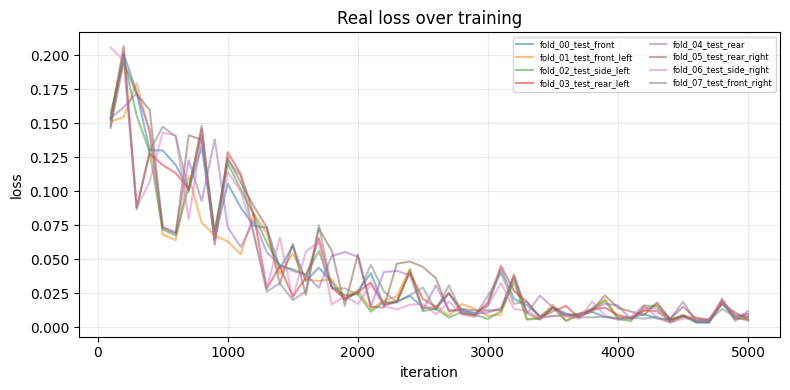

Saved: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics/generated_loss_over_training.png


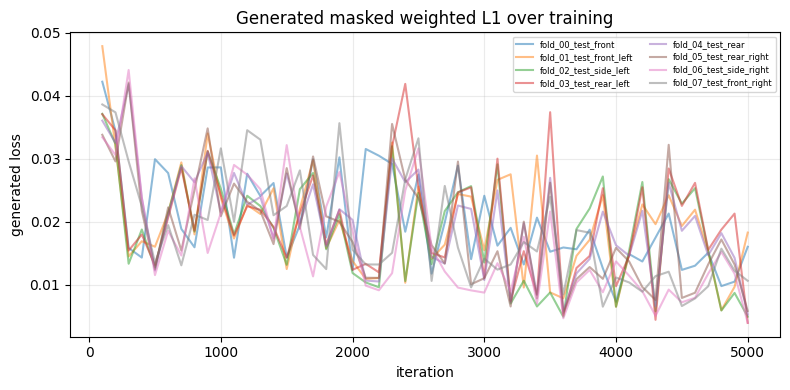

Done. Key outputs:
Scene root: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/scene_graphdeco_brum_strict_v7_slerp_depth
Models    : /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/model_brum_strict_v8_LOO_CV_ALLDATA_METHODS
Eval CSVs : /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS
Diagnostics: /content/drive/MyDrive/ResearchProject/gs_outputs_brum_strict_v7_slerp_depth/car_26004751/eval_brum_strict_v8_LOO_CV_ALLDATA_METHODS/diagnostics


In [19]:
# ============================================================
# Final diagnostics: collect per-fold training loss logs
# ============================================================
loss_rows = []
for run in split_runs:
    log_path = run['model_dir'] / 'brum_training_loss_log.csv'
    if log_path.exists():
        df_log = pd.read_csv(log_path)
        df_log['split'] = run['split']['name']
        loss_rows.append(df_log)

if loss_rows:
    df_loss = pd.concat(loss_rows, ignore_index=True)
    display(df_loss.tail())
    df_loss.to_csv(EVAL_ROOT / 'all_folds_training_loss_logs.csv', index=False)

    fig, ax = plt.subplots(figsize=(8, 4))
    for split_name, g in df_loss.groupby('split'):
        ax.plot(g['iteration'], g['real_loss'], alpha=0.5, label=split_name)
    ax.set_title('Real loss over training')
    ax.set_xlabel('iteration')
    ax.set_ylabel('loss')
    ax.grid(alpha=0.25)
    ax.legend(fontsize=6, ncol=2)
    plt.tight_layout()
    out = DIAG_ROOT / 'real_loss_over_training.png'
    fig.savefig(out, dpi=160, bbox_inches='tight')
    print('Saved:', out)
    plt.show()

    fig, ax = plt.subplots(figsize=(8, 4))
    for split_name, g in df_loss.groupby('split'):
        ax.plot(g['iteration'], g['gen_weighted_l1_no_ssim'], alpha=0.5, label=split_name)
    ax.set_title('Generated masked weighted L1 over training')
    ax.set_xlabel('iteration')
    ax.set_ylabel('generated loss')
    ax.grid(alpha=0.25)
    ax.legend(fontsize=6, ncol=2)
    plt.tight_layout()
    out = DIAG_ROOT / 'generated_loss_over_training.png'
    fig.savefig(out, dpi=160, bbox_inches='tight')
    print('Saved:', out)
    plt.show()
else:
    print('No per-fold training loss CSVs found yet. Run training cell first.')

print('Done. Key outputs:')
print('Scene root:', SCENE_ROOT)
print('Models    :', MODEL_ROOT)
print('Eval CSVs :', EVAL_ROOT)
print('Diagnostics:', DIAG_ROOT)
